# EVI Vegetation Health Forecasting — Kurdistan Region Iraq
## Revised & Improved Pipeline

**Improvements over the original notebook:**

| Item | Change |
|------|--------|
| Data range | Extended to **2016–2024** (from 2016–2024) |
| Study sites | **4 official governorates** via exact shapefiles (Erbil, Duhok, Sulaymaniyah, Halabja) |
| Climate features | Added **CHIRPS precipitation** + **ERA5 temperature** + cyclic month encoding |
| New models | **TCN**, **Transformer**, **CNN-Transformer** added |
| Removed | CNN (solo) and LSTM (solo) demoted to optional baselines |
| Forecast | **5-year (2026–2030)** as primary + **10-year (2026–2035)** scenario with growing CI |
| Uncertainty | MC-Dropout (n=100) with linearly growing envelope for long-range forecasts |

---
**Execution order:** Run cells top-to-bottom. Cell 8 (GEE extraction) auto-loads from CSV if already cached.

> **Requirements:** `tensorflow`, `scikit-learn`, `geopandas`, `earthengine-api`, `rasterio`, `seaborn`, `tqdm`, `python-dateutil`

## Cell 1 — Install Packages
> Run once, then restart the kernel.

In [ ]:
# Uncomment and run once, then restart kernel
# !pip install rasterio geopandas earthengine-api scikit-learn tensorflow keras matplotlib seaborn tqdm python-dateutil --quiet


## Cell 2 — Imports & Global Settings

In [20]:
import os, warnings, glob, time, subprocess, sys
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import matplotlib.dates as mdates
import matplotlib.patches as mpatches
import seaborn as sns
import geopandas as gpd
from pathlib import Path
from datetime import datetime
from dateutil.relativedelta import relativedelta
from tqdm import tqdm

import rasterio

import tensorflow as tf
from tensorflow import keras
from tensorflow.keras import layers, Model
from tensorflow.keras.callbacks import EarlyStopping, ReduceLROnPlateau
from sklearn.preprocessing import StandardScaler
from sklearn.model_selection import TimeSeriesSplit
from sklearn.metrics import mean_squared_error, mean_absolute_error, r2_score

warnings.filterwarnings('ignore')
np.random.seed(42)
tf.random.set_seed(42)

plt.rcParams.update({
    'figure.dpi': 120,
    'axes.spines.top': False,
    'axes.spines.right': False,
    'font.family': 'DejaVu Sans'
})

# ── Global constants ─────────────────────────────────────────────────
START_DATE = '2016-01-01'   # Sentinel-2 coverage reliable from 2016
END_DATE   = '2024-12-31'   # Include full 2024

COLORS       = ['#1f77b4', '#ff7f0e', '#2ca02c', '#d62728']
REGIONS      = ['Erbil', 'Duhok', 'Sulaymaniyah', 'Halabja']
REGION_NAMES = ['Erbil Governorate', 'Duhok Governorate',
                'Sulaymaniyah Governorate', 'Halabja Governorate']

# EVI constants (NASA MODIS standard)
G, C1, C2, L = 2.5, 6.0, 7.5, 1.0

print(f"TensorFlow: {tf.__version__}  |  Date range: {START_DATE} → {END_DATE}")
print("Setup complete.")


TensorFlow: 2.21.0  |  Date range: 2016-01-01 → 2024-12-31
Setup complete.


## Cell 3 — Load Kurdistan Governorate Shapefiles
Loads the four official governorate `.shp` files, reprojects to WGS-84,
dissolves multipart geometries, and converts each to a `ee.Geometry` polygon
for use in GEE queries.

In [8]:
import ee

# Authenticate (opens browser first time)
ee.Authenticate()

# Initialize with YOUR registered project ID (not project number)
ee.Initialize(project='my-project-test-399218')

In [9]:
import ee
import os
import geopandas as gpd

# ── Edit this path to match your local shapefiles directory ──────────
# SHP_DIR = r"/content/"
SHP_DIR = r"D:\vegetation_health_research\Kurdistan_Provinces_Shapefiles"

GOVERNORATE_FILES = {
    'Erbil':        ('Erbil_Province.shp',        'Erbil Governorate'),
    'Duhok':        ('Duhok_Province.shp',        'Duhok Governorate'),
    'Sulaymaniyah': ('Sulaimaniyah_Province.shp', 'Sulaymaniyah Governorate'),
    'Halabja':      ('Halabja_Province.shp',      'Halabja Governorate'),
}

def shp_to_ee_geometry(shp_file_path):
    """Read shapefile → WGS84 → dissolve → ee.Geometry + GeoDataFrame"""

    gdf = gpd.read_file(shp_file_path)

    if gdf.crs is None:
        raise ValueError(f"No CRS found in {shp_file_path}")

    # ensure WGS84
    if gdf.crs.to_epsg() != 4326:
        gdf = gdf.to_crs(epsg=4326)

    # dissolve into single polygon
    dissolved = gdf.dissolve()

    # convert to Earth Engine geometry
    ee_geom = ee.Geometry(dissolved.geometry.iloc[0].__geo_interface__)

    # simplify to avoid GEE geometry complexity errors
    ee_geom = ee_geom.simplify(0.001)

    return ee_geom, gdf


STUDY_REGIONS = {}

for key, (filename, label) in GOVERNORATE_FILES.items():
    shp_path = os.path.join(SHP_DIR, filename)

    ee_geom, gdf = shp_to_ee_geometry(shp_path)

    STUDY_REGIONS[key] = {
        'label': label,
        'geometry': ee_geom,
        'gdf': gdf
    }

    b = gdf.total_bounds

    print(
        f"  ✓ {key:<15} | features: {len(gdf)} "
        f"| bounds: [{b[0]:.3f}, {b[1]:.3f}, {b[2]:.3f}, {b[3]:.3f}]"
    )

print("\n✓ All 4 governorate shapefiles loaded — exact polygon boundaries.")

  ✓ Erbil           | features: 1 | bounds: [43.306, 35.455, 45.087, 37.322]
  ✓ Duhok           | features: 1 | bounds: [42.350, 36.179, 44.304, 37.381]
  ✓ Sulaymaniyah    | features: 1 | bounds: [44.531, 34.431, 46.349, 36.482]
  ✓ Halabja         | features: 1 | bounds: [45.755, 35.039, 46.198, 35.456]

✓ All 4 governorate shapefiles loaded — exact polygon boundaries.


## Cell 4 — Study Area Map
Quick local map using the loaded GeoDataFrames (no GEE required).

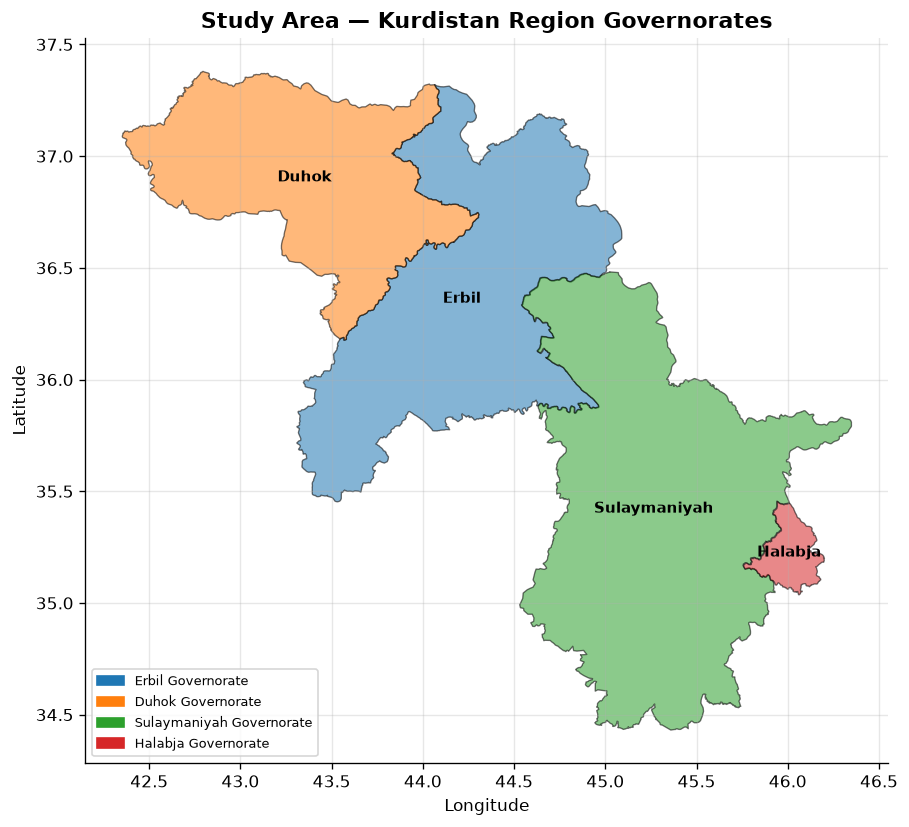

Saved: study_area_map.png


In [10]:
fig, ax = plt.subplots(figsize=(9, 7))
for region, color in zip(REGIONS, COLORS):
    info = STUDY_REGIONS[region]
    info['gdf'].plot(ax=ax, color=color, edgecolor='black', linewidth=0.8, alpha=0.55)
    cx = info['gdf'].geometry.centroid.iloc[0].x
    cy = info['gdf'].geometry.centroid.iloc[0].y
    ax.text(cx, cy, region, fontsize=9, fontweight='bold', ha='center', va='center')

patches = [mpatches.Patch(color=c, label=STUDY_REGIONS[r]['label'])
           for r, c in zip(REGIONS, COLORS)]
ax.legend(handles=patches, loc='lower left', fontsize=8)
ax.set_title('Study Area — Kurdistan Region Governorates', fontsize=13, fontweight='bold')
ax.set_xlabel('Longitude')
ax.set_ylabel('Latitude')
ax.grid(alpha=0.3)
plt.tight_layout()
plt.savefig('study_area_map.png', dpi=150, bbox_inches='tight')
plt.show()
print("Saved: study_area_map.png")


## Cell 5 — Google Earth Engine Authentication
Auto-detects the environment (local Jupyter, Colab, or service account).
**Edit `GEE_PROJECT`** to match your Google Cloud project ID.

In [11]:
GEE_PROJECT = 'my-project-test-399218'   # ← replace with your project ID

def _init_gee(project: str) -> None:
    """Initialise GEE using the best available credential method."""
    try:
        ee.Number(1).getInfo()
        print('✓ GEE already initialised.')
        return
    except Exception:
        pass

    cred_path = os.path.expanduser('~/.config/earthengine/credentials')
    if os.path.exists(cred_path):
        ee.Initialize(project=project)
        print(f'✓ GEE initialised from saved credentials (project={project})')
        return

    try:  # Google Colab
        from google.colab import auth as _colab_auth
        _colab_auth.authenticate_user()
        ee.Authenticate()
        ee.Initialize(project=project)
        print(f'✓ GEE initialised in Colab (project={project})')
        return
    except ImportError:
        pass

    key_file = os.environ.get('EE_SERVICE_ACCOUNT_KEY', '')
    sa_email = os.environ.get('EE_SERVICE_ACCOUNT_EMAIL', '')
    if key_file and sa_email and os.path.exists(key_file):
        creds = ee.ServiceAccountCredentials(email=sa_email, key_file=key_file)
        ee.Initialize(creds, project=project)
        print(f'✓ GEE initialised via service account')
        return

    print('Opening browser for one-time login …')
    ee.Authenticate()
    ee.Initialize(project=project)
    print(f'✓ GEE initialised (project={project})')


_init_gee(GEE_PROJECT)
assert ee.Number(42).getInfo() == 42
print('✓ GEE API verified and ready.')


✓ GEE already initialised.
✓ GEE API verified and ready.


## Cell 6 — GEE Helper Functions
SCL cloud masking and EVI band computation for Sentinel-2.

In [21]:
def mask_s2_clouds(image):
    """
    Strict SCL cloud/shadow masking + DN→reflectance scaling.

    Keeps:
    4 = vegetation
    5 = bare soil
    (6 water optional — kept here)

    Removes:
    clouds, cirrus, snow, shadows, defective, unclassified
    """
    scl = image.select('SCL')

    good = (
        scl.eq(4)   # vegetation
        .Or(scl.eq(5))  # bare soil
        #.Or(scl.eq(6))  # water (optional)
    )

    return (
        image.updateMask(good)
             .divide(10000)  # scale reflectance
             .copyProperties(image, ['system:time_start'])
    )


def add_evi_band(image):
    """
    Add EVI band to scaled Sentinel-2 image.
    Masks unrealistic EVI instead of clamping.
    """
    evi = image.expression(
        '2.5 * ((NIR - RED) / (NIR + 6.0 * RED - 7.5 * BLUE + 1.0))',
        {
            'NIR':  image.select('B8'),
            'RED':  image.select('B4'),
            'BLUE': image.select('B2')
        }
    ).rename('EVI')

    # Mask unrealistic EVI values (recommended scientific range)
    evi = evi.updateMask(evi.gt(-0.2).And(evi.lt(0.9)))

    return image.addBands(evi)


print("✓ Revised Sentinel-2 masking + EVI functions defined.")


✓ Revised Sentinel-2 masking + EVI functions defined.


In [17]:
raw_df = pd.read_csv(
    r"D:\vegetation_health_research\EVI_Forecast_Results\evi_climate_kurdistan_2016_2024.csv",
    parse_dates=['date']
)

def postprocess_data(raw_df: pd.DataFrame,
                     evi_col: str = 'evi_median',
                     min_valid_pixels: int = 50,
                     evi_range: tuple = (-0.1, 0.8)) -> pd.DataFrame:
    """QC, range-clip and gap-fill EVI + climate variables."""
    df = raw_df.copy()
    df['date'] = pd.to_datetime(df['date'])

    # 1. Mask low-quality EVI months
    if 'valid_pixels' in df.columns:
        df.loc[df['valid_pixels'] < min_valid_pixels, evi_col] = np.nan

    # 2. Clip EVI to physical range
    df[evi_col] = df[evi_col].clip(*evi_range)

    # 3. Seasonal gap-fill EVI
    df['month'] = df['date'].dt.month
    for region in df['region'].unique():
        mask   = df['region'] == region
        series = df.loc[mask, evi_col].copy()
        if series.isna().any():
            clim = series.groupby(df.loc[mask, 'month']).transform('mean')
            df.loc[mask, evi_col] = series.fillna(clim)
            df.loc[mask, evi_col] = df.loc[mask, evi_col].interpolate('linear')

    # 4. Fill climate variable gaps
    for col in ['precip_mm', 'temp_c']:
        if col in df.columns:
            for region in df['region'].unique():
                mask = df['region'] == region
                df.loc[mask, col] = (
                    df.loc[mask, col].interpolate('linear').ffill().bfill()
                )

    df.drop(columns=['month'], inplace=True)
    return df


clean_df = postprocess_data(raw_df)

# Pre-2016 pixel coverage diagnostic
print("=== Pre-2016 Sentinel-2 pixel coverage ===")
pre2016 = clean_df[clean_df['date'].dt.year < 2016]
for region in REGIONS:
    sub     = pre2016[pre2016['region'] == region]
    n_valid = sub['evi_median'].notna().sum()
    avg_px  = sub['valid_pixels'].mean() if 'valid_pixels' in sub.columns else 0
    print(f"  {region}: {n_valid}/{len(sub)} months valid | "
          f"avg valid pixels/month: {avg_px:.0f}")
print("(Months with <50 valid pixels were gap-filled from climatology)")

=== Pre-2016 Sentinel-2 pixel coverage ===
  Erbil: 0/0 months valid | avg valid pixels/month: nan
  Duhok: 0/0 months valid | avg valid pixels/month: nan
  Sulaymaniyah: 0/0 months valid | avg valid pixels/month: nan
  Halabja: 0/0 months valid | avg valid pixels/month: nan
(Months with <50 valid pixels were gap-filled from climatology)


## Cell 7 — Monthly EVI + Climate Extraction Function
Defines `get_monthly_data_for_region()` which queries three GEE datasets
in a single month-by-month loop:
- **Sentinel-2** → EVI (mean, median, std, min, max, pixel count)
- **TerraClimate** → total monthly precipitation (mm)
- **TerraClimate*** → mean 2 m air temperature (°C)


In [18]:
def get_monthly_data_for_region(region_name: str, region_info: dict) -> list:
    """
    Extract monthly EVI (Sentinel-2), precipitation (TerraClimate*), and
    temperature (TerraClimate*) for one governorate using its exact shapefile geometry.
    Returns a list of dicts — one per calendar month in START_DATE→END_DATE.
    """
    roi = region_info['geometry']   # exact shapefile polygon (ee.Geometry)

    # Pre-filter Sentinel-2 collection for the full period
    s2_col = (
        ee.ImageCollection('COPERNICUS/S2_SR_HARMONIZED')
        .filterBounds(roi)
        .filterDate(START_DATE, END_DATE)
        .filter(ee.Filter.lt('CLOUDY_PIXEL_PERCENTAGE', 80)) # change to 70 for less gaps of monthly data
        .map(mask_s2_clouds)
        .map(add_evi_band)
        .select('EVI')
    )

    records = []
    current = datetime.strptime(START_DATE, '%Y-%m-%d')
    end     = datetime.strptime(END_DATE,   '%Y-%m-%d')

    while current <= end:
        ms = current.strftime('%Y-%m-%d')
        me = (current + relativedelta(months=1)).strftime('%Y-%m-%d')

        # ===============================
        # EVI — monthly median composite
        # ===============================
        monthly_col = s2_col.filterDate(ms, me)

        if monthly_col.size().getInfo() == 0:
            evi_stats = {}
        else:
            monthly_evi = monthly_col.median()
            evi_stats   = monthly_evi.reduceRegion(
                reducer=(
                    ee.Reducer.mean()
                      .combine(ee.Reducer.median(), sharedInputs=True)
                      .combine(ee.Reducer.stdDev(), sharedInputs=True)
                      .combine(ee.Reducer.min(),    sharedInputs=True)
                      .combine(ee.Reducer.max(),    sharedInputs=True)
                      .combine(ee.Reducer.count(),  sharedInputs=True)
                ),
                geometry=roi,
                scale=100,
                maxPixels=1e10,
                bestEffort=True
            ).getInfo()

        # ==========================================
        # TerraClimate — monthly precipitation + temperature
        # ==========================================
        tc_col = (
           ee.ImageCollection('IDAHO_EPSCOR/TERRACLIMATE')
           .filterDate(ms, me)
           .filterBounds(roi)
        )

        if tc_col.size().getInfo() == 0:
           precip_val = None
           temp_c     = None
        else:
            tc_img = tc_col.first()

            # Precipitation (mm)
            precip_stats = tc_img.select('pr').reduceRegion(
                reducer=ee.Reducer.mean(),
                geometry=roi,
                scale=4000,
                maxPixels=1e9,
                bestEffort=True
            ).getInfo()

            precip_val = precip_stats.get('pr')

            # Mean temperature from tmmx + tmmn (°C)
            temp_stats = tc_img.select(['tmmx','tmmn']).reduceRegion(
                reducer=ee.Reducer.mean(),
                geometry=roi,
                scale=4000,
                maxPixels=1e9,
                bestEffort=True
            ).getInfo()

            tmax = temp_stats.get('tmmx')
            tmin = temp_stats.get('tmmn')

            if tmax is not None and tmin is not None:
                tmax_c = tmax * 0.1
                tmin_c = tmin * 0.1
                temp_c = round((tmax + tmin)/2, 4)
            else:
               temp_c = None


        # ===============================
        # Append monthly record
        # ===============================
        records.append({
            'region':       region_name,
            'date':         current,
            'evi_mean':     evi_stats.get('EVI_mean'),
            'evi_median':   evi_stats.get('EVI_median'),
            'evi_std':      evi_stats.get('EVI_stdDev'),
            'evi_min':      evi_stats.get('EVI_min'),
            'evi_max':      evi_stats.get('EVI_max'),
            'valid_pixels': evi_stats.get('EVI_count'),
            'precip_mm':    precip_val,
            'temp_c':       temp_c,
        })

        current += relativedelta(months=1)

    return records


print("✓ get_monthly_data_for_region() defined.")

✓ get_monthly_data_for_region() defined.


## Cell 8 — Run GEE Extraction (all 4 governorates)
> **Runtime:** 100–120 minutes on first run. Results are cached to
> `evi_climate_kurdistan_2016_2024.csv` and reloaded automatically on subsequent runs.
> A `.partial` backup CSV is written after each governorate so progress is not lost.

In [19]:
GEE_CSV_PATH = 'evi_climate_kurdistan_2016_2024.csv'

if os.path.exists(GEE_CSV_PATH):
    print(f"Found '{GEE_CSV_PATH}' — loading cached data.")
    raw_df = pd.read_csv(GEE_CSV_PATH, parse_dates=['date'])

else:
    print(f"Extracting EVI + climate for {len(REGIONS)} governorates …")
    print("Expected runtime: 60–120 min\n")

    all_records = []

    for region_name in REGIONS:
        region_info = STUDY_REGIONS[region_name]
        print(f"  [{region_name}] {region_info['label']} … ", end='', flush=True)
        t0 = time.time()

        try:
            records = get_monthly_data_for_region(region_name, region_info)

        except ee.EEException as exc:
            raise RuntimeError(
                f"\nGEE error on {region_name}: {exc}\n"
                "Tip: if geometry complexity error, add .simplify(0.001) "
                "before .dissolve() in shp_to_ee_geometry()"
            ) from exc

        non_null = sum(1 for r in records if r['evi_median'] is not None)

        print(
            f"done {time.time()-t0:.0f}s | "
            f"{non_null}/{len(records)} months with EVI data "
            f"({100*non_null/len(records):.0f}%)"
        )

        all_records.extend(records)

        # partial save (safety)
        pd.DataFrame(all_records).to_csv(GEE_CSV_PATH + '.partial', index=False)

    raw_df = pd.DataFrame(all_records)
    raw_df.to_csv(GEE_CSV_PATH, index=False)

    if os.path.exists(GEE_CSV_PATH + '.partial'):
        os.remove(GEE_CSV_PATH + '.partial')

    print(f"\n✓ Saved: {GEE_CSV_PATH}")


# ======================
# Sanity checks
# ======================
assert len(raw_df) > 0,                 'raw_df is empty — check extraction above.'
assert 'evi_median' in raw_df.columns,  'evi_median column missing.'
assert raw_df['region'].nunique() == 4, f"Expected 4 governorates, got {raw_df['region'].nunique()}"

print(
    f"\nrows={len(raw_df)} | governorates={raw_df['region'].nunique()} | "
    f"date range: {raw_df['date'].min().date()} → {raw_df['date'].max().date()}"
)

print(raw_df.head(8).to_string(index=False))

Extracting EVI + climate for 4 governorates …
Expected runtime: 60–120 min

  [Erbil] Erbil Governorate … 

KeyboardInterrupt: 

## Cell 9 — Quality Control, Gap Filling & Pre-2016 Coverage Check
1. Flag months with fewer than 50 valid pixels as `NaN`
2. Clip EVI to physical range `[−0.10, 0.80]`
3. Gap-fill with climatological monthly mean, then linear interpolation
4. Interpolate missing precipitation and temperature values

## Cell 10 — Build Wide-Format DataFrames
Pivot to separate DataFrames for EVI, precipitation, and temperature.

In [22]:
def pivot_variable(df: pd.DataFrame, value_col: str) -> pd.DataFrame:
    out = (
        df.pivot(index='date', columns='region', values=value_col)
          .sort_index()[REGIONS]
    )
    out.columns.name = None
    return out


evi_df    = pivot_variable(clean_df, 'evi_median')
precip_df = pivot_variable(clean_df, 'precip_mm')
temp_df   = pivot_variable(clean_df, 'temp_c')

DATES         = evi_df.index
N_MONTHS      = len(DATES)
START_DATE_DT = DATES[0].to_pydatetime()
END_DATE_DT   = DATES[-1].to_pydatetime()

print(f"EVI    shape: {evi_df.shape}  |  {DATES[0].date()} → {DATES[-1].date()}")
print(f"Precip shape: {precip_df.shape}")
print(f"Temp   shape: {temp_df.shape}")
print()
print(evi_df.describe().round(4))


EVI    shape: (108, 4)  |  2016-01-01 → 2024-12-01
Precip shape: (108, 4)
Temp   shape: (108, 4)

          Erbil     Duhok  Sulaymaniyah   Halabja
count  108.0000  108.0000      108.0000  108.0000
mean     0.1475    0.1727        0.1426    0.1833
std      0.0744    0.0689        0.0692    0.0947
min      0.0740    0.0957        0.0739    0.0917
25%      0.0975    0.1284        0.0897    0.1074
50%      0.1132    0.1445        0.1113    0.1421
75%      0.1835    0.1914        0.1757    0.2363
max      0.4023    0.3867        0.3633    0.4571


## Cell 11 — Data Quality Report & Time-Series Plot

DATA QUALITY REPORT — Sentinel-2 EVI + Climate (2016–2024)

Erbil:
  Total months   : 108
  Valid (raw)    : 106 (98.1%)
  Gap-filled     : 2 (1.9%)
  EVI range      : [0.0740, 0.4023]
  EVI mean ± std : 0.1475 ± 0.0744
  Precip (mm/mo) : 50.7 ± 54.5
  Temp mean (°C) : 18.9 ± 9.6

Duhok:
  Total months   : 108
  Valid (raw)    : 107 (99.1%)
  Gap-filled     : 1 (0.9%)
  EVI range      : [0.0957, 0.3867]
  EVI mean ± std : 0.1727 ± 0.0689
  Precip (mm/mo) : 63.9 ± 70.6
  Temp mean (°C) : 19.0 ± 9.5

Sulaymaniyah:
  Total months   : 108
  Valid (raw)    : 107 (99.1%)
  Gap-filled     : 1 (0.9%)
  EVI range      : [0.0739, 0.3633]
  EVI mean ± std : 0.1426 ± 0.0692
  Precip (mm/mo) : 50.8 ± 56.2
  Temp mean (°C) : 20.3 ± 9.4

Halabja:
  Total months   : 108
  Valid (raw)    : 102 (94.4%)
  Gap-filled     : 6 (5.6%)
  EVI range      : [0.0917, 0.4571]
  EVI mean ± std : 0.1833 ± 0.0947
  Precip (mm/mo) : 61.2 ± 67.2
  Temp mean (°C) : 19.6 ± 9.2


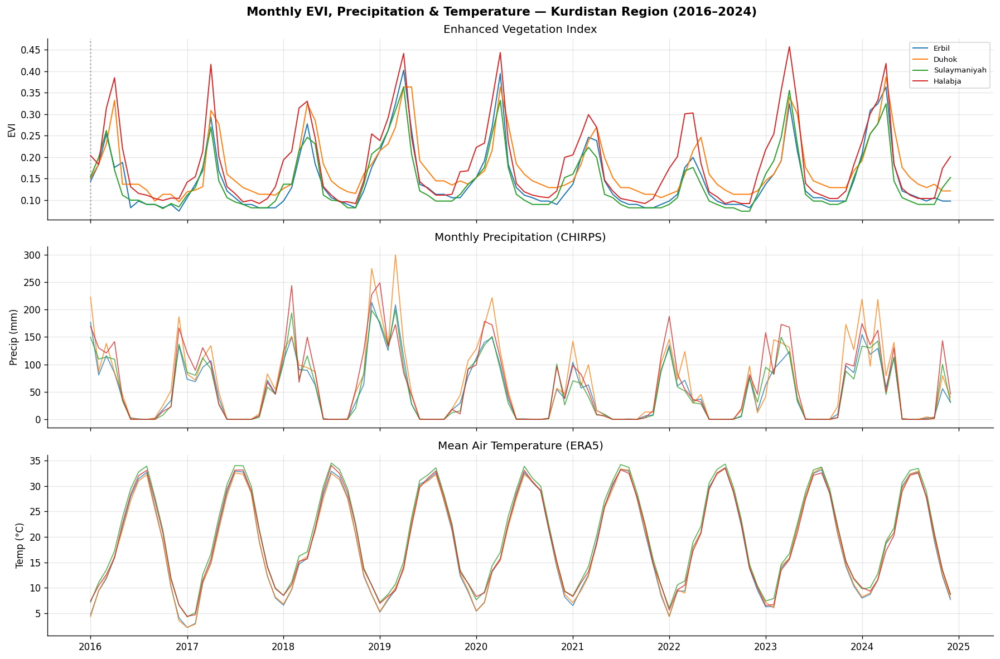

Saved: evi_climate_timeseries.png


In [5]:
print('=' * 65)
print('DATA QUALITY REPORT — Sentinel-2 EVI + Climate (2016–2024)')
print('=' * 65)

for region in REGIONS:
    s          = evi_df[region]
    n_total    = len(s)
    n_raw_null = int(raw_df.loc[raw_df['region'] == region, 'evi_median'].isna().sum())
    print(f"\n{region}:")
    print(f"  Total months   : {n_total}")
    print(f"  Valid (raw)    : {n_total - n_raw_null} ({100*(n_total-n_raw_null)/n_total:.1f}%)")
    print(f"  Gap-filled     : {n_raw_null} ({100*n_raw_null/n_total:.1f}%)")
    print(f"  EVI range      : [{s.min():.4f}, {s.max():.4f}]")
    print(f"  EVI mean ± std : {s.mean():.4f} ± {s.std():.4f}")
    print(f"  Precip (mm/mo) : {precip_df[region].mean():.1f} ± {precip_df[region].std():.1f}")
    print(f"  Temp mean (°C) : {temp_df[region].mean():.1f} ± {temp_df[region].std():.1f}")

fig, axes = plt.subplots(3, 1, figsize=(15, 10), sharex=True)
fig.suptitle('Monthly EVI, Precipitation & Temperature — Kurdistan Region (2016–2024)',
             fontsize=13, fontweight='bold')

for region, col in zip(REGIONS, COLORS):
    axes[0].plot(evi_df.index,    evi_df[region],    color=col, linewidth=1.2, label=region)
    axes[1].plot(precip_df.index, precip_df[region], color=col, linewidth=1.0, alpha=0.8)
    axes[2].plot(temp_df.index,   temp_df[region],   color=col, linewidth=1.0, alpha=0.8)

axes[0].set_ylabel('EVI');          axes[0].set_title('Enhanced Vegetation Index')
axes[1].set_ylabel('Precip (mm)');  axes[1].set_title('Monthly Precipitation (CHIRPS)')
axes[2].set_ylabel('Temp (°C)');   axes[2].set_title('Mean Air Temperature (ERA5)')
axes[0].legend(fontsize=8, loc='upper right')
axes[0].axvline(pd.Timestamp('2016-01-01'), color='gray', linestyle=':', alpha=0.6)
for ax in axes:
    ax.grid(alpha=0.3)

plt.tight_layout()
plt.savefig('evi_climate_timeseries.png', dpi=150, bbox_inches='tight')
plt.show()
print('Saved: evi_climate_timeseries.png')


## Cell 12 — Annual EVI Statistics Table

In [6]:
annual_stats = []
for region in REGIONS:
    for year, grp in evi_df[region].groupby(evi_df.index.year):
        annual_stats.append({
            'Region': region, 'Year': year,
            'Mean': round(float(grp.mean()), 6),
            'Std':  round(float(grp.std()),  6),
            'Max':  round(float(grp.max()),  6),
            'Min':  round(float(grp.min()),  6),
        })

stats_df = pd.DataFrame(annual_stats).set_index(['Region', 'Year'])
print('Annual EVI Statistics (2016–2024):')
print(stats_df.to_string())


Annual EVI Statistics (2016–2024):
                       Mean       Std       Max       Min
Region       Year                                        
Erbil        2016  0.129037  0.058377  0.253878  0.073992
             2017  0.126797  0.060978  0.292966  0.081683
             2018  0.140549  0.057890  0.277351  0.081852
             2019  0.191315  0.100221  0.402333  0.105330
             2020  0.161195  0.090391  0.394519  0.089672
             2021  0.134000  0.060984  0.246069  0.081808
             2022  0.117749  0.038670  0.199216  0.081915
             2023  0.149659  0.067199  0.324207  0.097504
             2024  0.176972  0.100506  0.363296  0.097453
Duhok        2016  0.154117  0.067561  0.332037  0.095709
             2017  0.154283  0.066609  0.308581  0.111336
             2018  0.176909  0.067309  0.324224  0.115231
             2019  0.208802  0.083655  0.363288  0.134745
             2020  0.182743  0.071296  0.363255  0.128852
             2021  0.158163  0.053326

## Cell 13 — Annual Statistics Figure (2×2 panel)

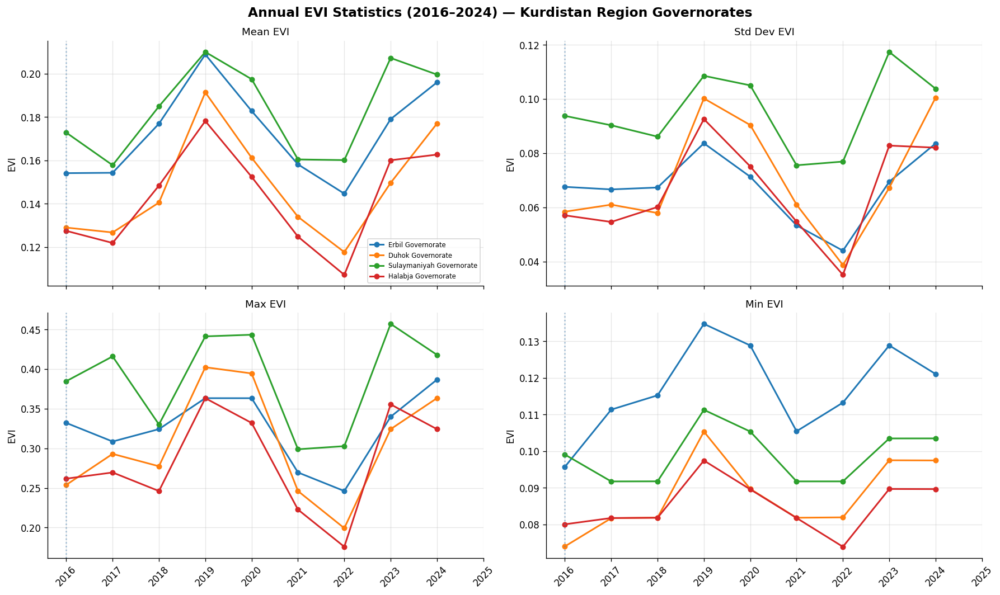

Saved: evi_annual_statistics.png


In [7]:
annual_mean = stats_df['Mean'].unstack(0)
annual_std  = stats_df['Std'].unstack(0)
annual_max  = stats_df['Max'].unstack(0)
annual_min  = stats_df['Min'].unstack(0)

fig, axes = plt.subplots(2, 2, figsize=(15, 9), sharex=True)
fig.suptitle('Annual EVI Statistics (2016–2024) — Kurdistan Region Governorates',
             fontsize=14, fontweight='bold')

panels = [
    (annual_mean, 'Mean EVI',    axes[0, 0]),
    (annual_std,  'Std Dev EVI', axes[0, 1]),
    (annual_max,  'Max EVI',     axes[1, 0]),
    (annual_min,  'Min EVI',     axes[1, 1]),
]
for data, title, ax in panels:
    for col, color, label in zip(data.columns, COLORS, REGION_NAMES):
        ax.plot(data.index, data[col], marker='o', color=color,
                linewidth=1.8, markersize=5, label=label)
    ax.set_title(title, fontsize=11)
    ax.set_ylabel('EVI')
    ax.set_xticks(list(range(2016, 2026)))
    ax.tick_params(axis='x', rotation=45)
    ax.grid(alpha=0.3)
    ax.axvline(2016, color='steelblue', linestyle=':', alpha=0.5)

axes[0, 0].legend(fontsize=7, loc='lower right')
plt.tight_layout()
plt.savefig('evi_annual_statistics.png', dpi=150, bbox_inches='tight')
plt.show()
print('Saved: evi_annual_statistics.png')


## Cell 14 — Z-Score Normalisation + Cyclic Month Encoding
All three variables are normalised independently per governorate.
Month-of-year is encoded as `sin(2πm/12)` and `cos(2πm/12)` to preserve
cyclical continuity across December→January boundaries.

In [23]:
scalers_evi    = {}
scalers_precip = {}
scalers_temp   = {}

evi_norm    = pd.DataFrame(index=evi_df.index)
precip_norm = pd.DataFrame(index=precip_df.index)
temp_norm   = pd.DataFrame(index=temp_df.index)

for region in REGIONS:
    sc_e = StandardScaler()
    sc_p = StandardScaler()
    sc_t = StandardScaler()
    evi_norm[region]    = sc_e.fit_transform(evi_df[[region]]).ravel()
    precip_norm[region] = sc_p.fit_transform(precip_df[[region]]).ravel()
    temp_norm[region]   = sc_t.fit_transform(temp_df[[region]]).ravel()
    scalers_evi[region]    = sc_e
    scalers_precip[region] = sc_p
    scalers_temp[region]   = sc_t

# Cyclic month features (shared across regions)
months    = evi_df.index.month
month_sin = np.sin(2 * np.pi * months / 12)
month_cos = np.cos(2 * np.pi * months / 12)

print('Z-score normalisation applied: EVI, precipitation, temperature')
print('Cyclic month features: month_sin, month_cos')
print('Feature vector per timestep: [EVI, precip, temp, month_sin, month_cos] = 5 features')
print(evi_norm.describe().round(4))


Z-score normalisation applied: EVI, precipitation, temperature
Cyclic month features: month_sin, month_cos
Feature vector per timestep: [EVI, precip, temp, month_sin, month_cos] = 5 features
          Erbil     Duhok  Sulaymaniyah   Halabja
count  108.0000  108.0000      108.0000  108.0000
mean    -0.0000    0.0000       -0.0000   -0.0000
std      1.0047    1.0047        1.0047    1.0047
min     -0.9924   -1.1227       -0.9974   -0.9718
25%     -0.6753   -0.6466       -0.7684   -0.8055
50%     -0.4629   -0.4116       -0.4540   -0.4379
75%      0.4869    0.2714        0.4815    0.5619
max      3.4419    3.1186        3.2044    2.9037


## Cell 15 — Multivariate Sliding-Window Sequence Creation
Each sample is a window of 24 consecutive monthly feature vectors `(seq_len=24, 5)`,
with the target being the next month's normalised EVI.

In [24]:
N_FEATURES = 5   # EVI, precip, temp, month_sin, month_cos

def build_feature_matrix(region: str) -> pd.DataFrame:
    """Assemble the 5-column normalised feature matrix for one governorate."""
    return pd.DataFrame({
        'evi':       evi_norm[region].values,
        'precip':    precip_norm[region].values,
        'temp':      temp_norm[region].values,
        'month_sin': month_sin,
        'month_cos': month_cos,
    }, index=evi_df.index)


def create_sequences_mv(region: str, seq_len: int):
    """
    Sliding-window multivariate sequences.
    X: (n_samples, seq_len, N_FEATURES)
    y: (n_samples,)  — next-step normalised EVI
    """
    feat       = build_feature_matrix(region).values
    evi_target = evi_norm[region].values
    X, y = [], []
    for i in range(len(feat) - seq_len):
        X.append(feat[i : i + seq_len])
        y.append(evi_target[i + seq_len])
    return np.array(X), np.array(y)


# Quick sanity check
X_chk, y_chk = create_sequences_mv('Erbil', 24)
print(f'Sequences (seq_len=24): X={X_chk.shape}, y={y_chk.shape}')
print(f'Features: {["EVI", "precip", "temp", "month_sin", "month_cos"]}')


Sequences (seq_len=24): X=(84, 24, 5), y=(84,)
Features: ['EVI', 'precip', 'temp', 'month_sin', 'month_cos']


## Cell 16 — Train / Test Split & TensorFlow Datasets

In [25]:
def prepare_region_data(region: str, seq_len: int = 24,
                         test_ratio: float = 0.2,
                         batch_size: int = 16):
    """Full pipeline: sequences → 80/20 split → tf.data.Datasets + raw arrays."""
    X, y  = create_sequences_mv(region, seq_len)
    split = int(len(X) * (1 - test_ratio))
    X_tr, X_te = X[:split], X[split:]
    y_tr, y_te = y[:split], y[split:]

    train_ds = (
        tf.data.Dataset.from_tensor_slices((X_tr, y_tr))
        .shuffle(buffer_size=256, seed=42)
        .batch(batch_size)
        .prefetch(tf.data.AUTOTUNE)
    )
    test_ds = (
        tf.data.Dataset.from_tensor_slices((X_te, y_te))
        .batch(batch_size)
        .prefetch(tf.data.AUTOTUNE)
    )
    return train_ds, test_ds, X_tr, X_te, y_tr, y_te


print('✓ prepare_region_data() defined — multivariate pipeline ready.')


✓ prepare_region_data() defined — multivariate pipeline ready.


## Cell 17 — Deep Learning Model Architectures (9 models)

| Category | Models |
|----------|--------|
| **Kept** | BiLSTM, GRU, CNN-GRU, CNN-BiLSTM, BiLSTM-GRU, CNN-BiLSTM-GRU |
| **New ★** | TCN, Transformer, CNN-Transformer |
| **Baseline** | LSTM, CNN (optional comparison only) |

All models use `input shape = (seq_len, N_FEATURES)` for multivariate input.

In [26]:
# ── Kept models (updated for multivariate input) ────────────────────

def build_bilstm(seq_len=24, units=64, dropout=0.3, n_feat=N_FEATURES):
    inp = layers.Input(shape=(seq_len, n_feat))
    x   = layers.Bidirectional(layers.LSTM(units, return_sequences=True))(inp)
    x   = layers.Dropout(dropout)(x)
    x   = layers.Bidirectional(layers.LSTM(units // 2, return_sequences=True))(x)
    x   = layers.Dropout(dropout)(x)
    x   = layers.Bidirectional(layers.LSTM(units // 4))(x)
    return Model(inp, layers.Dense(1)(x), name='BiLSTM')

def build_gru(seq_len=24, units=64, dropout=0.3, n_feat=N_FEATURES):
    inp = layers.Input(shape=(seq_len, n_feat))
    x   = layers.GRU(units, return_sequences=True)(inp)
    x   = layers.Dropout(dropout)(x)
    x   = layers.GRU(units)(x)
    x   = layers.Dropout(dropout)(x)
    return Model(inp, layers.Dense(1)(x), name='GRU')

def build_cnn_gru(seq_len=24, filters=64, units=64, dropout=0.3, n_feat=N_FEATURES):
    inp = layers.Input(shape=(seq_len, n_feat))
    x   = layers.Conv1D(filters, 3, activation='relu', padding='same')(inp)
    x   = layers.BatchNormalization()(x)
    x   = layers.GRU(units)(x)
    x   = layers.Dropout(dropout)(x)
    return Model(inp, layers.Dense(1)(x), name='CNN_GRU')

def build_cnn_bilstm(seq_len=24, filters=64, units=64, dropout=0.3, n_feat=N_FEATURES):
    inp = layers.Input(shape=(seq_len, n_feat))
    x   = layers.Conv1D(filters, 3, activation='relu', padding='same')(inp)
    x   = layers.BatchNormalization()(x)
    x   = layers.Bidirectional(layers.LSTM(units))(x)
    x   = layers.Dropout(dropout)(x)
    return Model(inp, layers.Dense(1)(x), name='CNN_BiLSTM')

def build_bilstm_gru(seq_len=24, units=64, dropout=0.3, n_feat=N_FEATURES):
    inp = layers.Input(shape=(seq_len, n_feat))
    x   = layers.Bidirectional(layers.LSTM(units, return_sequences=True))(inp)
    x   = layers.Dropout(dropout)(x)
    x   = layers.GRU(units)(x)
    x   = layers.Dropout(dropout)(x)
    return Model(inp, layers.Dense(1)(x), name='BiLSTM_GRU')

def build_cnn_bilstm_gru(seq_len=24, filters=64, units=64, dropout=0.3, n_feat=N_FEATURES):
    inp = layers.Input(shape=(seq_len, n_feat))
    x   = layers.Conv1D(filters, 3, activation='relu', padding='same')(inp)
    x   = layers.BatchNormalization()(x)
    x   = layers.Bidirectional(layers.LSTM(units, return_sequences=True))(x)
    x   = layers.Dropout(dropout)(x)
    x   = layers.GRU(units // 2)(x)
    x   = layers.Dropout(dropout)(x)
    return Model(inp, layers.Dense(1)(x), name='CNN_BiLSTM_GRU')


# ── NEW: Temporal Convolutional Network (TCN) — dilated causal convolutions
def build_tcn(seq_len=24, filters=64, dropout=0.2, n_feat=N_FEATURES):
    inp = layers.Input(shape=(seq_len, n_feat))
    x   = layers.Conv1D(filters, 3, padding='causal', dilation_rate=1, activation='relu')(inp)
    x   = layers.Conv1D(filters, 3, padding='causal', dilation_rate=2, activation='relu')(x)
    x   = layers.Conv1D(filters, 3, padding='causal', dilation_rate=4, activation='relu')(x)
    x   = layers.Conv1D(filters, 3, padding='causal', dilation_rate=8, activation='relu')(x)
    x   = layers.Dropout(dropout)(x)
    x   = layers.GlobalAveragePooling1D()(x)
    return Model(inp, layers.Dense(1)(x), name='TCN')


# ── NEW: Transformer — multi-head self-attention
def build_transformer(seq_len=24, d_model=64, n_heads=4,
                       dropout=0.1, n_feat=N_FEATURES):
    inp  = layers.Input(shape=(seq_len, n_feat))
    x    = layers.Dense(d_model)(inp)
    attn = layers.MultiHeadAttention(num_heads=n_heads,
                                      key_dim=d_model // n_heads)(x, x)
    x    = layers.LayerNormalization(epsilon=1e-6)(x + attn)
    ff   = layers.Dense(d_model * 2, activation='relu')(x)
    ff   = layers.Dense(d_model)(ff)
    x    = layers.LayerNormalization(epsilon=1e-6)(x + ff)
    x    = layers.Dropout(dropout)(x)
    x    = layers.GlobalAveragePooling1D()(x)
    return Model(inp, layers.Dense(1)(x), name='Transformer')


# ── NEW: CNN-Transformer hybrid — local features + global attention
def build_cnn_transformer(seq_len=24, filters=64, d_model=64,
                           n_heads=4, dropout=0.2, n_feat=N_FEATURES):
    inp  = layers.Input(shape=(seq_len, n_feat))
    x    = layers.Conv1D(filters, 3, padding='same', activation='relu')(inp)
    x    = layers.BatchNormalization()(x)
    x    = layers.Dense(d_model)(x)
    attn = layers.MultiHeadAttention(num_heads=n_heads,
                                      key_dim=d_model // n_heads)(x, x)
    x    = layers.LayerNormalization(epsilon=1e-6)(x + attn)
    x    = layers.Dropout(dropout)(x)
    x    = layers.GlobalAveragePooling1D()(x)
    return Model(inp, layers.Dense(1)(x), name='CNN_Transformer')


# ── Optional baselines ────────────────────────────────────────────────
def build_lstm(seq_len=24, units=64, dropout=0.3, n_feat=N_FEATURES):
    inp = layers.Input(shape=(seq_len, n_feat))
    x   = layers.LSTM(units)(inp)
    x   = layers.Dropout(dropout)(x)
    return Model(inp, layers.Dense(1)(x), name='LSTM_baseline')

def build_cnn(seq_len=24, filters=64, dropout=0.3, n_feat=N_FEATURES):
    inp = layers.Input(shape=(seq_len, n_feat))
    x   = layers.Conv1D(filters, 3, activation='relu', padding='same')(inp)
    x   = layers.Conv1D(filters // 2, 3, activation='relu', padding='same')(x)
    x   = layers.GlobalAveragePooling1D()(x)
    x   = layers.Dropout(dropout)(x)
    return Model(inp, layers.Dense(1)(x), name='CNN_baseline')


# ── Model registry: name → (builder_fn, seq_len, learning_rate) ──────
MODEL_REGISTRY = {
    # Primary
    'BiLSTM':          (build_bilstm,          24, 0.0005),
    'GRU':             (build_gru,             24, 0.0005),
    'CNN_GRU':         (build_cnn_gru,         24, 0.001),
    'CNN_BiLSTM':      (build_cnn_bilstm,      24, 0.0005),
    'BiLSTM_GRU':      (build_bilstm_gru,      24, 0.0005),
    'CNN_BiLSTM_GRU':  (build_cnn_bilstm_gru,  24, 0.0005),
    # New
    'TCN':             (build_tcn,             24, 0.001),
    'Transformer':     (build_transformer,     24, 0.0005),
    'CNN_Transformer': (build_cnn_transformer, 24, 0.0005),
    # Optional baselines
    'LSTM_baseline':   (build_lstm,            24, 0.0005),
    'CNN_baseline':    (build_cnn,             24, 0.0005),
}

PRIMARY_MODELS  = [m for m in MODEL_REGISTRY if 'baseline' not in m]
BASELINE_MODELS = [m for m in MODEL_REGISTRY if 'baseline'     in m]

print(f"{'Model':<22} {'Params':>10}  Type")
print('-' * 42)
for name, (builder, seq_len, _) in MODEL_REGISTRY.items():
    m   = builder(seq_len=seq_len)
    tag = 'NEW ★' if name in ('TCN','Transformer','CNN_Transformer') \
          else 'BASE'  if 'baseline' in name else 'KEPT'
    print(f"{name:<22} {m.count_params():>10,}  [{tag}]")


Model                      Params  Type
------------------------------------------
BiLSTM                     87,457  [KEPT]
GRU                        38,657  [KEPT]
CNN_GRU                    26,305  [KEPT]
CNN_BiLSTM                 67,457  [KEPT]
BiLSTM_GRU                 73,153  [KEPT]
CNN_BiLSTM_GRU             82,913  [KEPT]
TCN                        38,145  [NEW ★]
Transformer                33,921  [NEW ★]
CNN_Transformer            22,273  [NEW ★]
LSTM_baseline              17,985  [BASE]
CNN_baseline                7,233  [BASE]


## Cell 18 — Training Loop
> **11 models × 4 governorates = 44 experiments.**  
> With `epochs=150` and early stopping, expect ~30–90 min total on a GPU.

In [27]:
EPOCHS     = 150
BATCH_SIZE = 16
PATIENCE   = 20


def train_model(model_name: str, region: str,
                epochs: int = EPOCHS, verbose: int = 0):
    """Train one model on one governorate. Returns model, history, predictions, metrics."""
    builder, seq_len, lr = MODEL_REGISTRY[model_name]
    model = builder(seq_len=seq_len)
    model.compile(optimizer=keras.optimizers.Adam(lr),
                  loss='mse', metrics=['mae'])

    train_ds, test_ds, X_tr, X_te, y_tr, y_te = \
        prepare_region_data(region, seq_len=seq_len, batch_size=BATCH_SIZE)

    callbacks = [
        EarlyStopping(monitor='val_loss', patience=PATIENCE,
                      restore_best_weights=True, verbose=0),
        ReduceLROnPlateau(monitor='val_loss', factor=0.5,
                          patience=10, min_lr=1e-6, verbose=0),
    ]

    history = model.fit(train_ds, validation_data=test_ds,
                        epochs=epochs, callbacks=callbacks, verbose=verbose)

    y_pred_norm = model.predict(X_te, verbose=0).ravel()
    scaler      = scalers_evi[region]
    y_pred = scaler.inverse_transform(y_pred_norm.reshape(-1, 1)).ravel()
    y_true = scaler.inverse_transform(y_te.reshape(-1, 1)).ravel()

    metrics = {
        'MSE':      mean_squared_error(y_true, y_pred),
        'MAE':      mean_absolute_error(y_true, y_pred),
        'R2':       r2_score(y_true, y_pred),
        'Accuracy': float(np.mean(np.abs(y_pred - y_true) <= 0.05)),
    }
    return model, history, y_pred, y_true, metrics


# Run all experiments
all_results = {}
for model_name in MODEL_REGISTRY:
    all_results[model_name] = {}
    for region in REGIONS:
        model, history, y_pred, y_true, metrics = train_model(model_name, region)
        all_results[model_name][region] = (model, history, y_pred, y_true, metrics)
        print(f"  {model_name:22s} | {region:15s} | "
              f"R²={metrics['R2']:.4f}  MSE={metrics['MSE']:.2e}  "
              f"MAE={metrics['MAE']:.4f}  Acc={metrics['Accuracy']:.4f}")
    print()

print("✓ Training complete.")


  BiLSTM                 | Erbil           | R²=0.8845  MSE=8.79e-04  MAE=0.0184  Acc=0.8824
  BiLSTM                 | Duhok           | R²=0.9399  MSE=3.17e-04  MAE=0.0131  Acc=1.0000
  BiLSTM                 | Sulaymaniyah    | R²=0.9417  MSE=3.03e-04  MAE=0.0120  Acc=1.0000
  BiLSTM                 | Halabja         | R²=0.9629  MSE=3.12e-04  MAE=0.0141  Acc=1.0000

  GRU                    | Erbil           | R²=0.8649  MSE=1.03e-03  MAE=0.0247  Acc=0.8235
  GRU                    | Duhok           | R²=0.9062  MSE=4.95e-04  MAE=0.0170  Acc=0.9412
  GRU                    | Sulaymaniyah    | R²=0.9077  MSE=4.80e-04  MAE=0.0183  Acc=1.0000
  GRU                    | Halabja         | R²=0.9244  MSE=6.36e-04  MAE=0.0206  Acc=0.8824

  CNN_GRU                | Erbil           | R²=0.9286  MSE=5.44e-04  MAE=0.0181  Acc=0.9412
  CNN_GRU                | Duhok           | R²=0.9047  MSE=5.03e-04  MAE=0.0156  Acc=0.9412
  CNN_GRU                | Sulaymaniyah    | R²=0.9227  MSE=4.02e-04

## Cell 19 — Evaluation Results Table

In [28]:
rows = []
for model_name in MODEL_REGISTRY:
    for region in REGIONS:
        _, _, _, _, m = all_results[model_name][region]
        rows.append({
            'Model':    model_name,
            'Region':   region,
            'MSE':      round(m['MSE'],      6),
            'MAE':      round(m['MAE'],      6),
            'R2':       round(m['R2'],       6),
            'Accuracy': round(m['Accuracy'], 4),
        })

results_df = pd.DataFrame(rows)
print('Evaluation Results — EVI Forecasting (Kurdistan Region 2016–2024)')
print(results_df.to_string(index=False))

best_models = results_df.loc[results_df.groupby('Region')['R2'].idxmax()]
print('\nBest Model per Governorate (by R²):')
print(best_models[['Region','Model','R2','MSE','MAE','Accuracy']].to_string(index=False))


Evaluation Results — EVI Forecasting (Kurdistan Region 2016–2024)
          Model       Region      MSE      MAE        R2  Accuracy
         BiLSTM        Erbil 0.000879 0.018378  0.884492    0.8824
         BiLSTM        Duhok 0.000317 0.013127  0.939918    1.0000
         BiLSTM Sulaymaniyah 0.000303 0.012000  0.941662    1.0000
         BiLSTM      Halabja 0.000312 0.014094  0.962929    1.0000
            GRU        Erbil 0.001028 0.024668  0.864865    0.8235
            GRU        Duhok 0.000495 0.016952  0.906246    0.9412
            GRU Sulaymaniyah 0.000480 0.018318  0.907667    1.0000
            GRU      Halabja 0.000636 0.020586  0.924381    0.8824
        CNN_GRU        Erbil 0.000544 0.018108  0.928553    0.9412
        CNN_GRU        Duhok 0.000503 0.015576  0.904684    0.9412
        CNN_GRU Sulaymaniyah 0.000402 0.015783  0.922736    0.9412
        CNN_GRU      Halabja 0.000505 0.018689  0.939971    1.0000
     CNN_BiLSTM        Erbil 0.000638 0.018411  0.916121    0.9

In [29]:
# ============================================================================
# Cell 19b — Gap-Filling Sensitivity Check
# (Response to Reviewer 1, Comment 7: "gap-filling issue not adequately tested")
#
# Logic:
#   1. Identify which calendar months were originally gap-filled per region
#      (i.e. NaN in raw_df or valid_pixels < 50), BEFORE postprocess_data() filled them.
#   2. Rebuild the same 24-month sliding windows used elsewhere in the notebook,
#      but flag any window whose TARGET or whose 24-month INPUT sequence
#      touches a gap-filled month.
#   3. Retrain BiLSTM (the best-performing model) per governorate on a
#      "clean-only" training set that excludes all flagged windows.
#   4. Evaluate on the SAME held-out test set used everywhere else in the
#      notebook (already gap-filling-free per manuscript QC section — this
#      cell asserts that rather than assuming it).
#   5. Report R² with vs. without gap-filled windows in training.
#
# Requires Cells 1–19 to have already run (uses raw_df, clean_df, evi_norm,
# precip_norm, temp_norm, month_sin, month_cos, scalers_evi, REGIONS,
# N_FEATURES, build_bilstm, all_results, EPOCHS, BATCH_SIZE, PATIENCE).
# ============================================================================
 
import numpy as np
import pandas as pd
from sklearn.metrics import mean_squared_error, mean_absolute_error, r2_score
from tensorflow import keras
from tensorflow.keras.callbacks import EarlyStopping, ReduceLROnPlateau
 
SEQ_LEN = 24
 
# ---------------------------------------------------------------------------
# 1. Per-region boolean mask: was this calendar month originally gap-filled?
# ---------------------------------------------------------------------------
gapfill_flags = {}
for region in REGIONS:
    sub = raw_df.loc[raw_df['region'] == region].sort_values('date').reset_index(drop=True)
    was_missing = sub['evi_median'].isna()
    if 'valid_pixels' in sub.columns:
        was_missing = was_missing | (sub['valid_pixels'] < 50)
    gapfill_flags[region] = was_missing.values  # aligned to evi_df.index order
 
print("Gap-filled months per governorate (sanity check vs. manuscript §QC):")
for region in REGIONS:
    n = gapfill_flags[region].sum()
    print(f"  {region:15s}: {n} month(s) ({100*n/len(gapfill_flags[region]):.1f}%)")
 
# ---------------------------------------------------------------------------
# 2. Rebuild sliding windows with a "touches_gapfill" flag per sample
# ---------------------------------------------------------------------------
def build_feature_matrix_local(region: str) -> pd.DataFrame:
    return pd.DataFrame({
        'evi':       evi_norm[region].values,
        'precip':    precip_norm[region].values,
        'temp':      temp_norm[region].values,
        'month_sin': month_sin,
        'month_cos': month_cos,
    }, index=evi_df.index)
 
def create_sequences_with_flag(region: str, seq_len: int = SEQ_LEN):
    feat       = build_feature_matrix_local(region).values
    evi_target = evi_norm[region].values
    flags      = gapfill_flags[region]
 
    X, y, touches_gapfill = [], [], []
    for i in range(len(feat) - seq_len):
        X.append(feat[i : i + seq_len])
        y.append(evi_target[i + seq_len])
        window_flag = flags[i : i + seq_len].any() or flags[i + seq_len]
        touches_gapfill.append(bool(window_flag))
 
    return (np.array(X), np.array(y), np.array(touches_gapfill))
 
# ---------------------------------------------------------------------------
# 3–4. Retrain BiLSTM per region on gap-filter-excluded training data,
#      evaluate on the untouched original test split
# ---------------------------------------------------------------------------
sensitivity_results = {}
 
for region in REGIONS:
    X, y, touches_gapfill = create_sequences_with_flag(region)
 
    split = int(len(X) * 0.8)   # identical 80/20 chronological split used elsewhere
    X_tr_full, X_te = X[:split], X[split:]
    y_tr_full, y_te = y[:split], y[split:]
    flag_tr, flag_te = touches_gapfill[:split], touches_gapfill[split:]
 
    # Assert test set is gap-filling-free, as stated in the manuscript
    n_test_flagged = flag_te.sum()
    assert n_test_flagged == 0, (
        f"{region}: {n_test_flagged} test-set window(s) touch a gap-filled month — "
        f"manuscript claim of a gap-filling-free test set does not hold, investigate."
    )
 
    # Clean-only training subset (drop windows touching a gap-filled month)
    clean_mask = ~flag_tr
    X_tr_clean, y_tr_clean = X_tr_full[clean_mask], y_tr_full[clean_mask]
    n_dropped = (~clean_mask).sum()
 
    # Build tf.data datasets directly (mirrors prepare_region_data in Cell 16)
    import tensorflow as tf
    train_ds_clean = (
        tf.data.Dataset.from_tensor_slices((X_tr_clean, y_tr_clean))
        .shuffle(buffer_size=256, seed=42)
        .batch(16)
        .prefetch(tf.data.AUTOTUNE)
    )
    test_ds = (
        tf.data.Dataset.from_tensor_slices((X_te, y_te))
        .batch(16)
        .prefetch(tf.data.AUTOTUNE)
    )
 
    model = build_bilstm(seq_len=SEQ_LEN)
    model.compile(optimizer=keras.optimizers.Adam(1e-3), loss='mse', metrics=['mae'])
 
    callbacks = [
        EarlyStopping(monitor='val_loss', patience=PATIENCE,
                      restore_best_weights=True, verbose=0),
        ReduceLROnPlateau(monitor='val_loss', factor=0.5,
                          patience=10, min_lr=1e-6, verbose=0),
    ]
 
    model.fit(train_ds_clean, validation_data=test_ds,
              epochs=EPOCHS, callbacks=callbacks, verbose=0)
 
    y_pred_norm = model.predict(X_te, verbose=0).ravel()
    scaler = scalers_evi[region]
    y_pred = scaler.inverse_transform(y_pred_norm.reshape(-1, 1)).ravel()
    y_true = scaler.inverse_transform(y_te.reshape(-1, 1)).ravel()
 
    sensitivity_results[region] = {
        'R2_clean_only':   r2_score(y_true, y_pred),
        'MAE_clean_only':  mean_absolute_error(y_true, y_pred),
        'n_dropped':       int(n_dropped),
        'n_train_total':   int(len(X_tr_full)),
    }
 
# ---------------------------------------------------------------------------
# 5. Compare against original BiLSTM results (all_results from Cell 18)
# ---------------------------------------------------------------------------
rows = []
for region in REGIONS:
    r2_orig = all_results['BiLSTM'][region][4]['R2']
    r2_clean = sensitivity_results[region]['R2_clean_only']
    rows.append({
        'Region':            region,
        'R2_original':       round(r2_orig, 4),
        'R2_excl_gapfilled': round(r2_clean, 4),
        'Delta_R2':          round(r2_clean - r2_orig, 4),
        'Windows_dropped':   sensitivity_results[region]['n_dropped'],
        'Windows_total_train': sensitivity_results[region]['n_train_total'],
    })
 
sensitivity_df = pd.DataFrame(rows)
print("\nGap-Filling Sensitivity Check — BiLSTM (Response to Reviewer 1, Comment 7)")
print(sensitivity_df.to_string(index=False))
 
mean_delta = sensitivity_df['Delta_R2'].abs().mean()
print(f"\nMean absolute R² change when excluding gap-filled windows: {mean_delta:.4f}")
 
sensitivity_df.to_csv('gapfill_sensitivity_check.csv', index=False)
print("Saved: gapfill_sensitivity_check.csv")

Gap-filled months per governorate (sanity check vs. manuscript §QC):
  Erbil          : 2 month(s) (1.9%)
  Duhok          : 1 month(s) (0.9%)
  Sulaymaniyah   : 1 month(s) (0.9%)
  Halabja        : 6 month(s) (5.6%)

Gap-Filling Sensitivity Check — BiLSTM (Response to Reviewer 1, Comment 7)
      Region  R2_original  R2_excl_gapfilled  Delta_R2  Windows_dropped  Windows_total_train
       Erbil       0.8845             0.8434   -0.0411                5                   67
       Duhok       0.9399             0.9287   -0.0112                1                   67
Sulaymaniyah       0.9417             0.9453    0.0036                1                   67
     Halabja       0.9629             0.9541   -0.0088               18                   67

Mean absolute R² change when excluding gap-filled windows: 0.0162
Saved: gapfill_sensitivity_check.csv


In [ ]:
# ============================================================================
# Cell 19c — Control: Random (Non-Gap-Filled) Window Drop
# (Response to Reviewer 1, Comments 6 & 7 — isolates "gap-filling caused this"
#  from "removing any N training samples causes this" by dropping the SAME
#  number of windows as Cell 19b, but chosen randomly from CLEAN windows only.)
#
# Logic:
#   1. Re-use the gap-fill flags and window counts (Windows_dropped) from
#      Cell 19b's sensitivity_df / gapfill_flags.
#   2. For each region, repeatedly (N_TRIALS times) randomly drop the SAME
#      number of non-gap-filled training windows, retrain BiLSTM, record R².
#   3. Report mean ± std R² over trials, and compare against:
#        - R2_original        (full training set, Cell 19b)
#        - R2_excl_gapfilled  (gap-filled windows specifically removed, Cell 19b)
#   4. Interpretation: if R2_original - R2_excl_gapfilled falls WITHIN the
#      spread of R2_original - R2_excl_random (mean ± std), the effect is
#      consistent with ordinary sample-size sensitivity, not a gap-filling-
#      specific bias. If it falls clearly OUTSIDE that spread (i.e. the
#      gap-filled-specific drop is much larger than random drops of the same
#      size), that supports a genuine gap-filling effect for that region.
#
# Requires Cells 1–19 and Cell 19b to have already run (uses raw_df, evi_norm,
# precip_norm, temp_norm, month_sin, month_cos, scalers_evi, REGIONS,
# N_FEATURES, build_bilstm, EPOCHS, BATCH_SIZE, PATIENCE, gapfill_flags,
# sensitivity_df from Cell 19b).
# ============================================================================
 
import numpy as np
import pandas as pd
import tensorflow as tf
from tensorflow import keras
from tensorflow.keras.callbacks import EarlyStopping, ReduceLROnPlateau
from sklearn.metrics import mean_absolute_error, r2_score
 
SEQ_LEN   = 24
N_TRIALS  = 5          # repeated random draws per region, to average out
                        # both random-selection variance AND training-run variance
RNG_SEED0 = 100         # base seed; trial i uses RNG_SEED0 + i
 
# ---------------------------------------------------------------------------
# 0. Pull the exact "windows to drop" counts from Cell 19b so this is a fair,
#    matched control (same sample-size reduction per region).
# ---------------------------------------------------------------------------
n_to_drop = dict(zip(sensitivity_df['Region'], sensitivity_df['Windows_dropped']))
print("Matched drop counts (from Cell 19b):", n_to_drop)
 
# ---------------------------------------------------------------------------
# 1. Rebuild full windows + gap-fill flag per region (same as Cell 19b)
# ---------------------------------------------------------------------------
def build_feature_matrix_local(region: str) -> pd.DataFrame:
    return pd.DataFrame({
        'evi':       evi_norm[region].values,
        'precip':    precip_norm[region].values,
        'temp':      temp_norm[region].values,
        'month_sin': month_sin,
        'month_cos': month_cos,
    }, index=evi_df.index)
 
def create_sequences_with_flag(region: str, seq_len: int = SEQ_LEN):
    feat       = build_feature_matrix_local(region).values
    evi_target = evi_norm[region].values
    flags      = gapfill_flags[region]
 
    X, y, touches_gapfill = [], [], []
    for i in range(len(feat) - seq_len):
        X.append(feat[i : i + seq_len])
        y.append(evi_target[i + seq_len])
        window_flag = flags[i : i + seq_len].any() or flags[i + seq_len]
        touches_gapfill.append(bool(window_flag))
 
    return np.array(X), np.array(y), np.array(touches_gapfill)
 
 
def train_bilstm_on_subset(X_tr, y_tr, X_te, y_te, region, seed):
    tf.keras.utils.set_random_seed(seed)   # seeds python/numpy/tf together
 
    train_ds = (
        tf.data.Dataset.from_tensor_slices((X_tr, y_tr))
        .shuffle(buffer_size=256, seed=seed)
        .batch(16)
        .prefetch(tf.data.AUTOTUNE)
    )
    test_ds = (
        tf.data.Dataset.from_tensor_slices((X_te, y_te))
        .batch(16)
        .prefetch(tf.data.AUTOTUNE)
    )
 
    model = build_bilstm(seq_len=SEQ_LEN)
    model.compile(optimizer=keras.optimizers.Adam(1e-3), loss='mse', metrics=['mae'])
 
    callbacks = [
        EarlyStopping(monitor='val_loss', patience=PATIENCE,
                      restore_best_weights=True, verbose=0),
        ReduceLROnPlateau(monitor='val_loss', factor=0.5,
                          patience=10, min_lr=1e-6, verbose=0),
    ]
    model.fit(train_ds, validation_data=test_ds,
              epochs=EPOCHS, callbacks=callbacks, verbose=0)
 
    y_pred_norm = model.predict(X_te, verbose=0).ravel()
    scaler = scalers_evi[region]
    y_pred = scaler.inverse_transform(y_pred_norm.reshape(-1, 1)).ravel()
    y_true = scaler.inverse_transform(y_te.reshape(-1, 1)).ravel()
    return r2_score(y_true, y_pred)
 
 
# ---------------------------------------------------------------------------
# 2. Run N_TRIALS random-drop trials per region
# ---------------------------------------------------------------------------
random_drop_results = {region: [] for region in REGIONS}
 
for region in REGIONS:
    X, y, touches_gapfill = create_sequences_with_flag(region)
    split = int(len(X) * 0.8)
    X_tr_full, X_te = X[:split], X[split:]
    y_tr_full, y_te = y[:split], y[split:]
    flag_tr = touches_gapfill[:split]
 
    clean_idx = np.where(~flag_tr)[0]   # indices of non-gap-filled training windows
    k = n_to_drop[region]
 
    for trial in range(N_TRIALS):
        rng = np.random.default_rng(RNG_SEED0 + trial)
        drop_idx = rng.choice(clean_idx, size=k, replace=False)
        keep_mask = np.ones(len(X_tr_full), dtype=bool)
        keep_mask[drop_idx] = False
 
        X_tr_rand, y_tr_rand = X_tr_full[keep_mask], y_tr_full[keep_mask]
 
        r2 = train_bilstm_on_subset(X_tr_rand, y_tr_rand, X_te, y_te,
                                     region, seed=RNG_SEED0 + trial)
        random_drop_results[region].append(r2)
        print(f"  {region:15s} | trial {trial+1}/{N_TRIALS} | "
              f"dropped {k} random clean windows | R²={r2:.4f}")
 
# ---------------------------------------------------------------------------
# 3. Summarise and compare against Cell 19b results
# ---------------------------------------------------------------------------
rows = []
for region in REGIONS:
    r2_orig    = sensitivity_df.loc[sensitivity_df['Region'] == region, 'R2_original'].iloc[0]
    r2_gapfill = sensitivity_df.loc[sensitivity_df['Region'] == region, 'R2_excl_gapfilled'].iloc[0]
    r2_rand_arr = np.array(random_drop_results[region])
 
    delta_gapfill = r2_gapfill - r2_orig
    delta_rand_mean = r2_rand_arr.mean() - r2_orig
    delta_rand_std  = r2_rand_arr.std()
 
    # Is the gap-filled-specific drop outside the random-drop spread (mean ± 1 std)?
    outside_spread = abs(delta_gapfill - delta_rand_mean) > delta_rand_std
 
    rows.append({
        'Region':                region,
        'R2_original':           round(r2_orig, 4),
        'R2_excl_gapfilled':     round(r2_gapfill, 4),
        'Delta_gapfilled':       round(delta_gapfill, 4),
        'R2_excl_random_mean':   round(r2_rand_arr.mean(), 4),
        'R2_excl_random_std':    round(delta_rand_std, 4),
        'Delta_random_mean':     round(delta_rand_mean, 4),
        'Gapfill_effect_beyond_sample_size': 'YES' if outside_spread else 'no (consistent with sample-size only)',
    })
 
control_df = pd.DataFrame(rows)
print("\nControl Check — Gap-Filled Drop vs. Random Drop (same N), BiLSTM")
print(control_df.to_string(index=False))
 
control_df.to_csv('gapfill_vs_random_control_check.csv', index=False)
print("\nSaved: gapfill_vs_random_control_check.csv")

Matched drop counts (from Cell 19b): {'Erbil': 5, 'Duhok': 1, 'Sulaymaniyah': 1, 'Halabja': 18}


## Cell 20 — Model Comparison Figure (R², MSE/MAE, Accuracy)

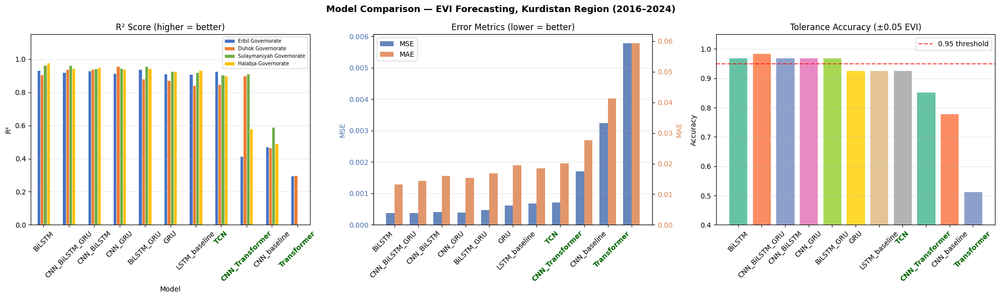

Saved: evi_model_comparison.png


In [8]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns

# ── Recreate results_df from your saved CSV ──────────────────────────────────
results_df = pd.read_csv('evi_model_metrics.csv')

# ── Constants (adjust to match your original script) ─────────────────────────
PRIMARY_MODELS = results_df['Model'].unique().tolist()   # or specify your list

REGION_NAMES = ['Erbil Governorate', 'Duhok Governorate',
                'Sulaymaniyah Governorate', 'Halabja Governorate']
COLORS = ['#4472C4', '#ED7D31', '#70AD47', '#FFC000']   # blue/orange/green/yellow

# ── Compute averages ──────────────────────────────────────────────────────────
avg_all    = results_df.groupby('Model')[['R2','MSE','MAE','Accuracy']].mean()
models_ord = avg_all.loc[PRIMARY_MODELS].sort_values('R2', ascending=False).index.tolist()
palette    = sns.color_palette('Set2', len(models_ord))

fig, axes = plt.subplots(1, 3, figsize=(20, 6))
fig.suptitle('Model Comparison — EVI Forecasting, Kurdistan Region (2016–2024)',
             fontsize=13, fontweight='bold')

# ── LEFT: R² per region ───────────────────────────────────────────────────────
pivot_r2 = (
    results_df[results_df['Model'].isin(PRIMARY_MODELS)]
    .pivot(index='Model', columns='Region', values='R2')
    .loc[models_ord]
)
pivot_r2.plot(kind='bar', ax=axes[0], color=COLORS, edgecolor='white', linewidth=0.5)
axes[0].set_title('R² Score (higher = better)')
axes[0].set_ylim(0, 1.15); axes[0].set_ylabel('R²')
axes[0].tick_params(axis='x', rotation=45)
axes[0].legend(REGION_NAMES, fontsize=7); axes[0].grid(axis='y', alpha=0.3)

# ── MIDDLE: Dual y-axes for MSE and MAE ──────────────────────────────────────
x, w = np.arange(len(models_ord)), 0.35
ax_mae = axes[1].twinx()

bars_mse = axes[1].bar(x - w/2, avg_all.loc[models_ord, 'MSE'], w,
                        label='MSE', color='#4C72B0', alpha=0.85)
bars_mae = ax_mae.bar(x + w/2, avg_all.loc[models_ord, 'MAE'], w,
                       label='MAE', color='#DD8452', alpha=0.85)

axes[1].set_xticks(x); axes[1].set_xticklabels(models_ord, rotation=45, ha='right')
axes[1].set_title('Error Metrics (lower = better)')
axes[1].set_ylabel('MSE', color='#4C72B0')
axes[1].tick_params(axis='y', labelcolor='#4C72B0')
ax_mae.set_ylabel('MAE', color='#DD8452')
ax_mae.tick_params(axis='y', labelcolor='#DD8452')
axes[1].grid(axis='y', alpha=0.3)
axes[1].legend([bars_mse, bars_mae], ['MSE', 'MAE'], loc='upper left')

# ── RIGHT: Tolerance Accuracy ─────────────────────────────────────────────────
bar_colors = [palette[i] for i in range(len(models_ord))]
axes[2].bar(models_ord, avg_all.loc[models_ord, 'Accuracy'],
            color=bar_colors, edgecolor='white')
axes[2].set_ylim(0.4, 1.05)
axes[2].set_title('Tolerance Accuracy (±0.05 EVI)')
axes[2].set_ylabel('Accuracy')
axes[2].tick_params(axis='x', rotation=45)
axes[2].axhline(0.95, color='red', linestyle='--', alpha=0.7, label='0.95 threshold')
axes[2].legend(); axes[2].grid(axis='y', alpha=0.3)

# ── Highlight new models in green ────────────────────────────────────────────
NEW_MODELS = {'TCN', 'Transformer', 'CNN_Transformer'}
for ax in [axes[0], axes[1], ax_mae, axes[2]]:
    for lbl in ax.get_xticklabels():
        if lbl.get_text() in NEW_MODELS:
            lbl.set_color('darkgreen'); lbl.set_fontweight('bold')

plt.tight_layout()
plt.savefig('evi_model_comparison.png', dpi=150, bbox_inches='tight')
plt.show()
print('Saved: evi_model_comparison.png')

## Cell 21 — Training & Validation Loss Curves

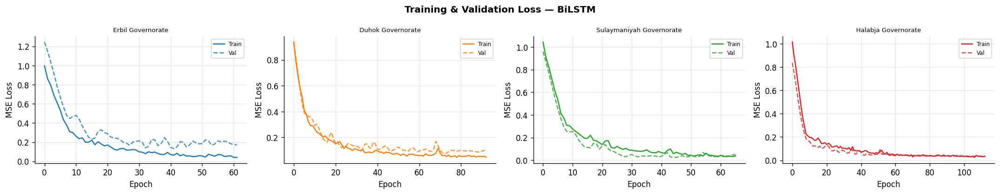

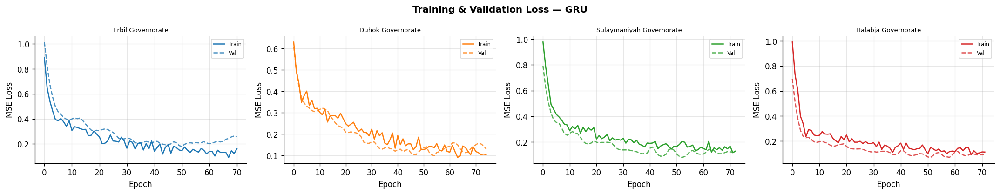

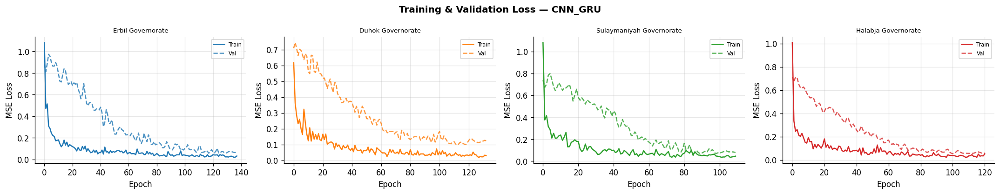

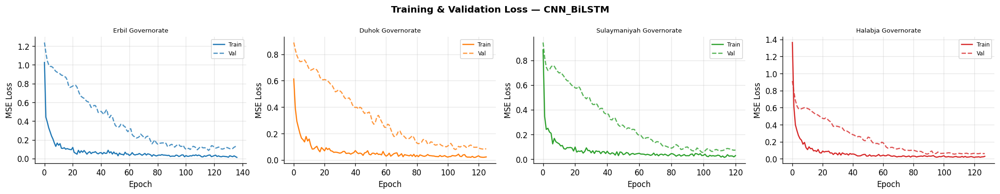

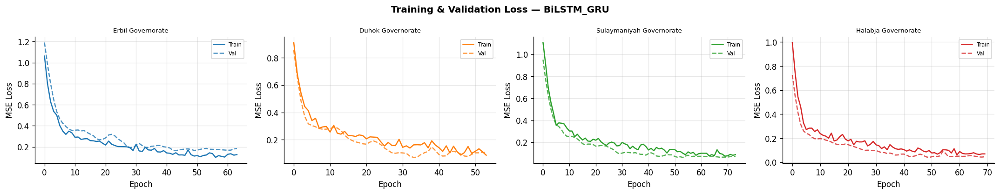

...

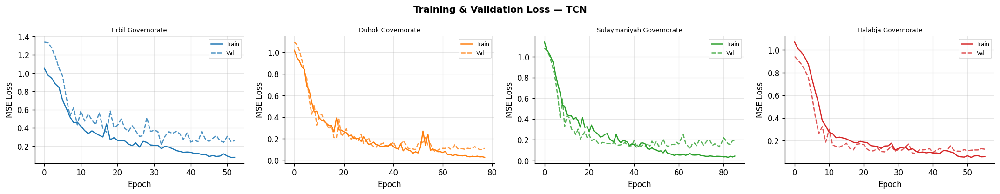

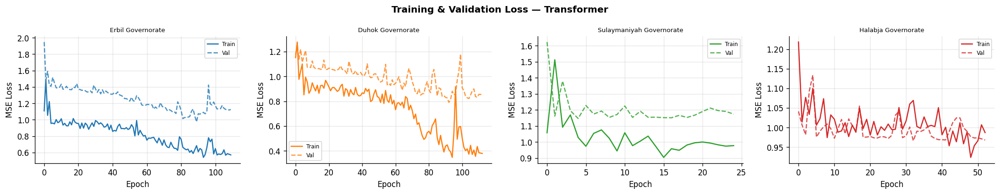

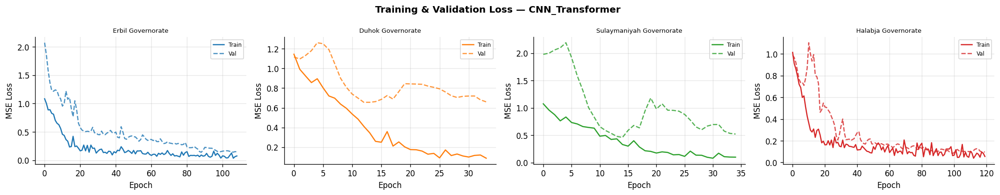

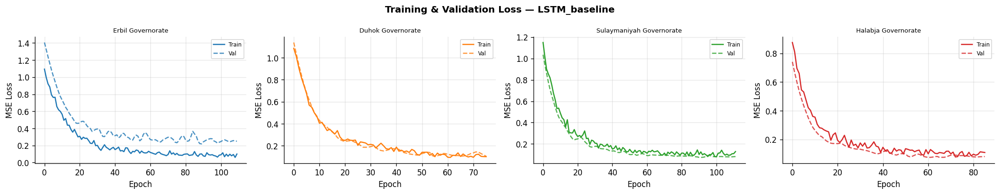

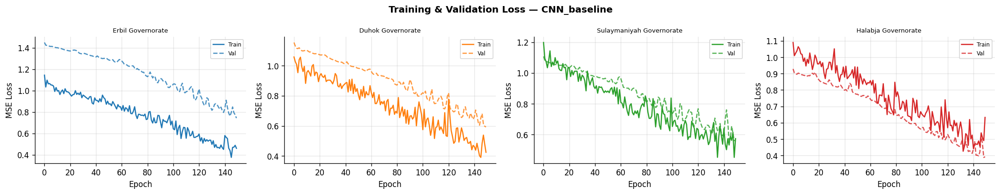

In [15]:
def plot_loss_curves(model_name: str):
    fig, axes = plt.subplots(1, 4, figsize=(18, 3.5), sharey=False)
    fig.suptitle(f'Training & Validation Loss — {model_name}',
                 fontsize=12, fontweight='bold')
    for ax, region, rname, col in zip(axes, REGIONS, REGION_NAMES, COLORS):
        _, history, *_ = all_results[model_name][region]
        ax.plot(history.history['loss'],     color=col, linewidth=1.5, label='Train')
        ax.plot(history.history['val_loss'], color=col, linewidth=1.5,
                linestyle='--', alpha=0.8, label='Val')
        ax.set_title(rname, fontsize=8)
        ax.set_xlabel('Epoch'); ax.set_ylabel('MSE Loss')
        ax.legend(fontsize=7); ax.grid(alpha=0.3)
    plt.tight_layout()
    plt.savefig(f'loss_{model_name}.png', dpi=130, bbox_inches='tight')
    plt.show()


for mn in MODEL_REGISTRY:
    plot_loss_curves(mn)


## Cell 22 — Predictions vs Ground Truth

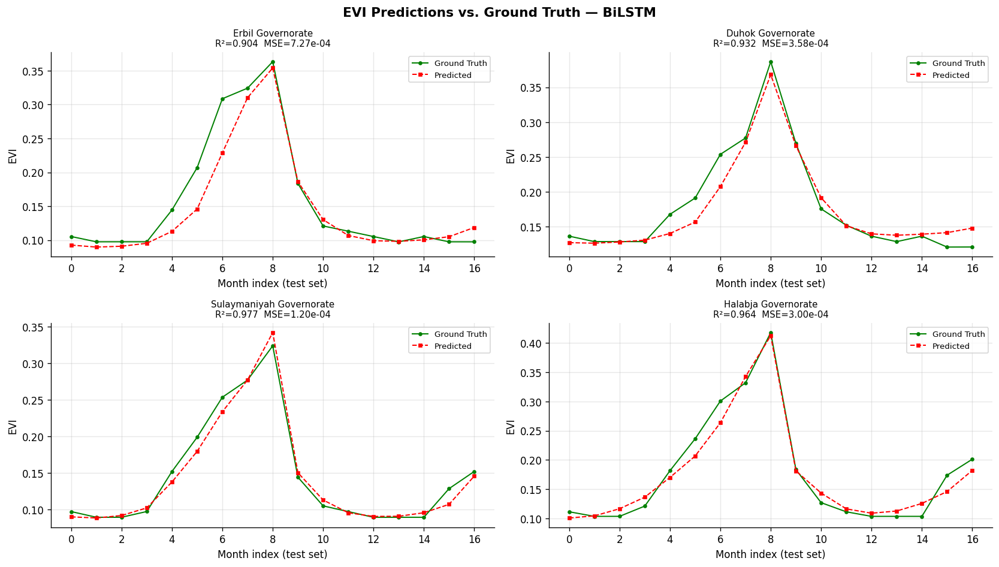

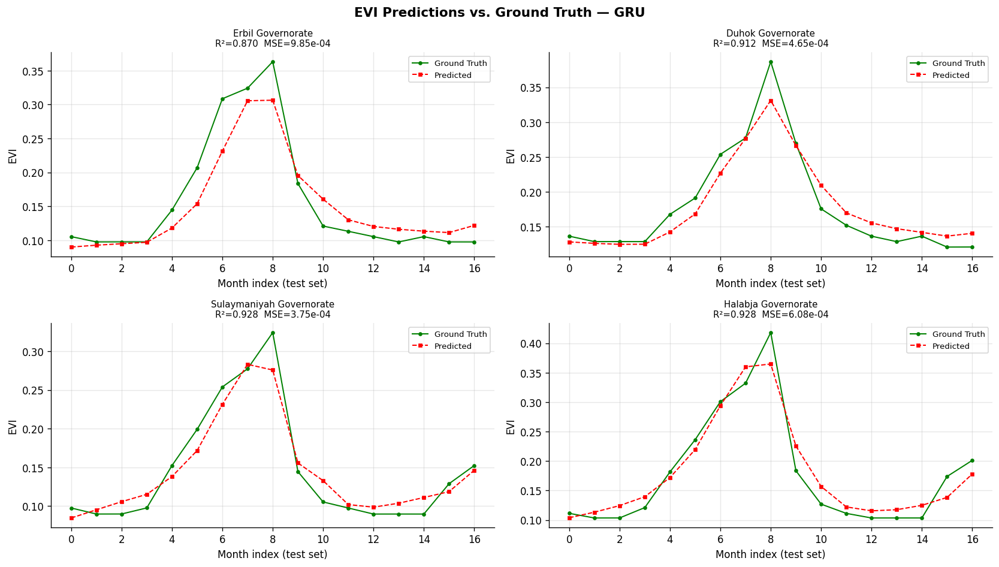

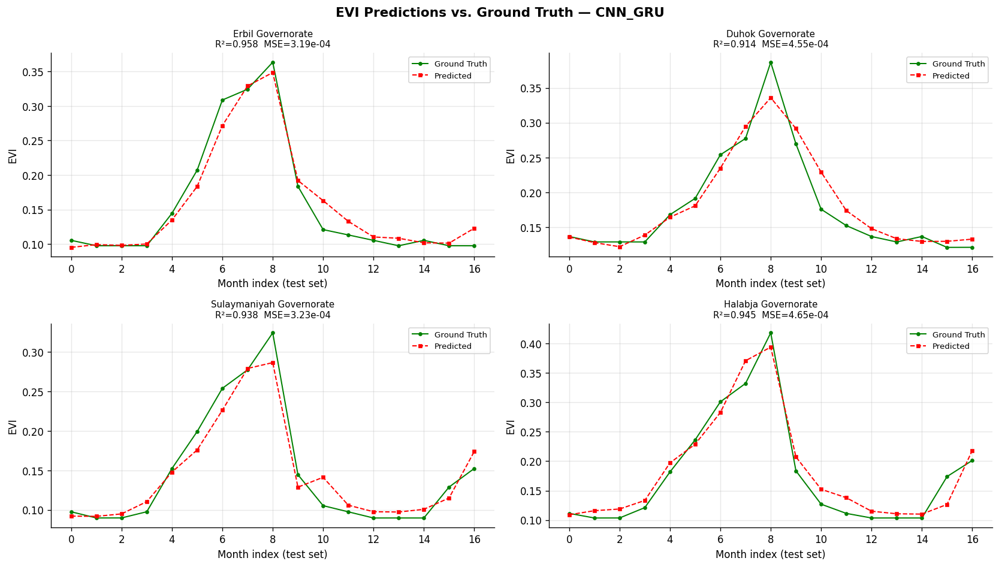

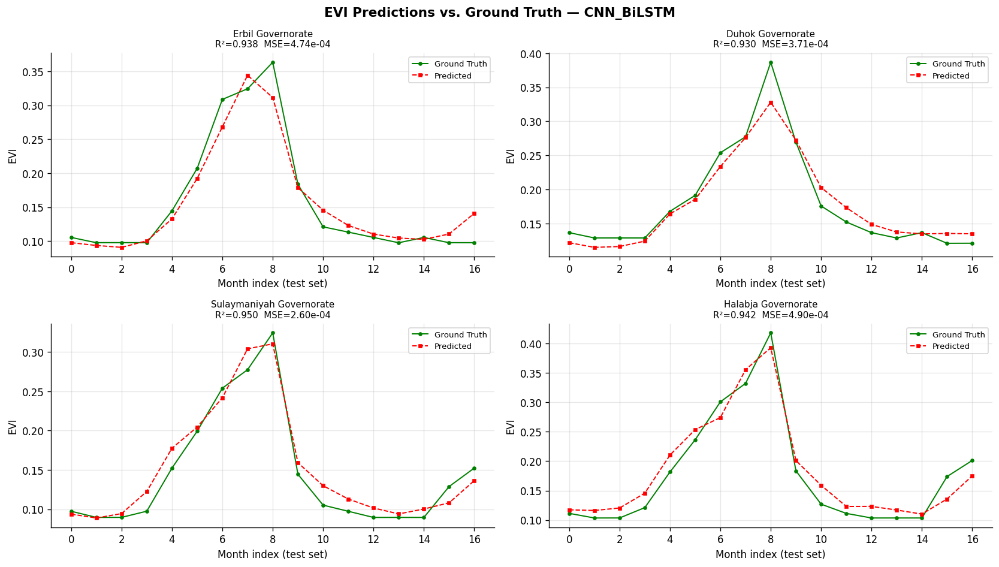

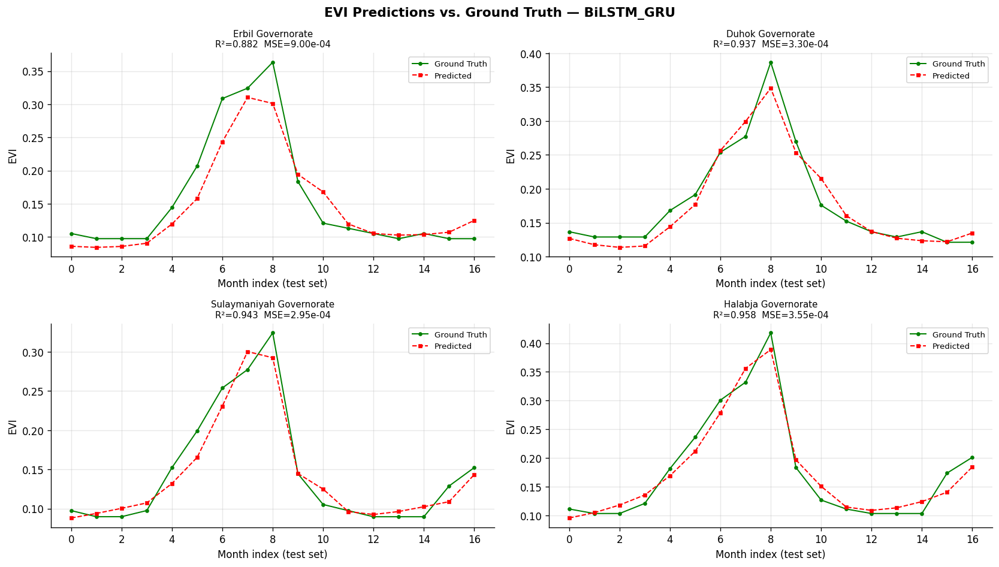

...

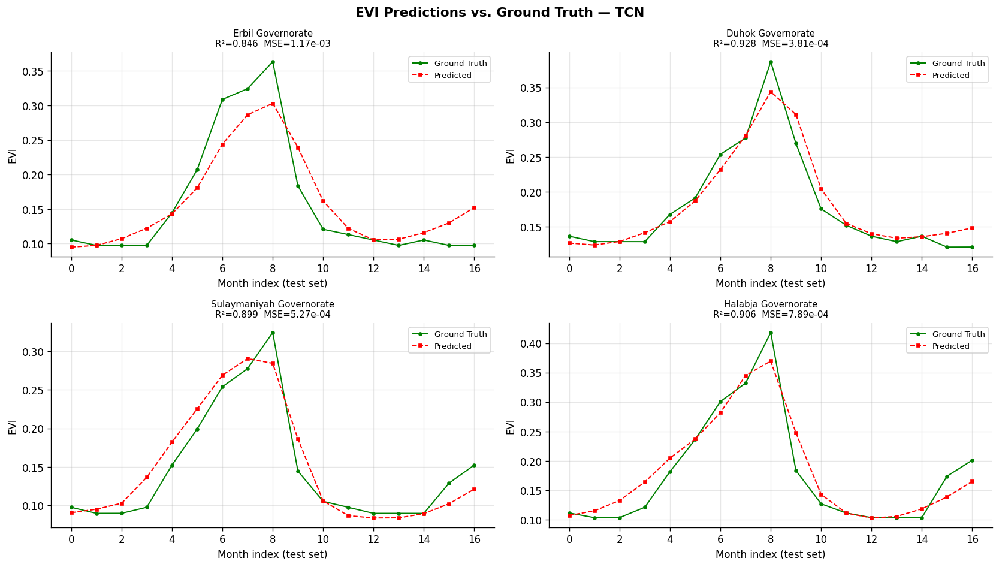

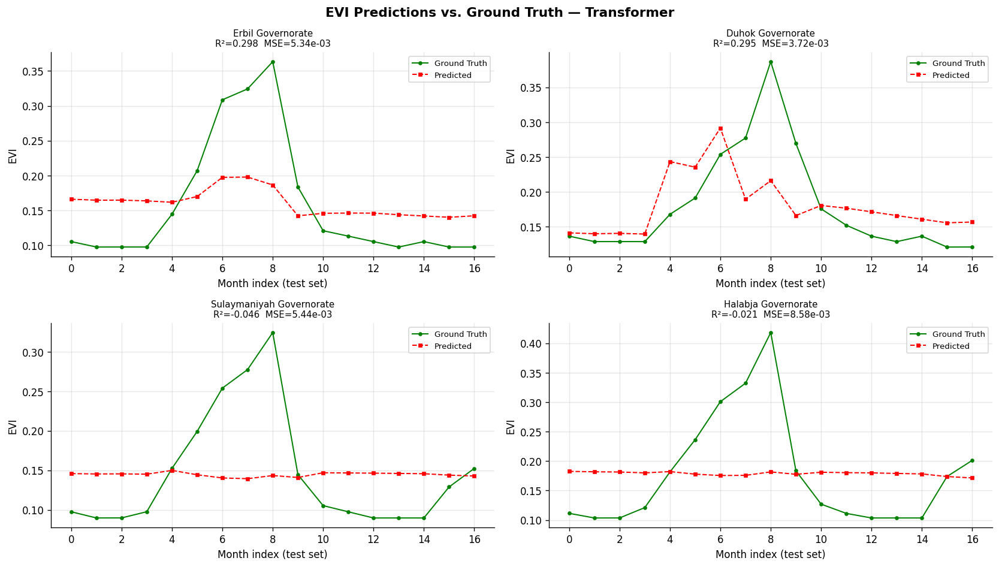

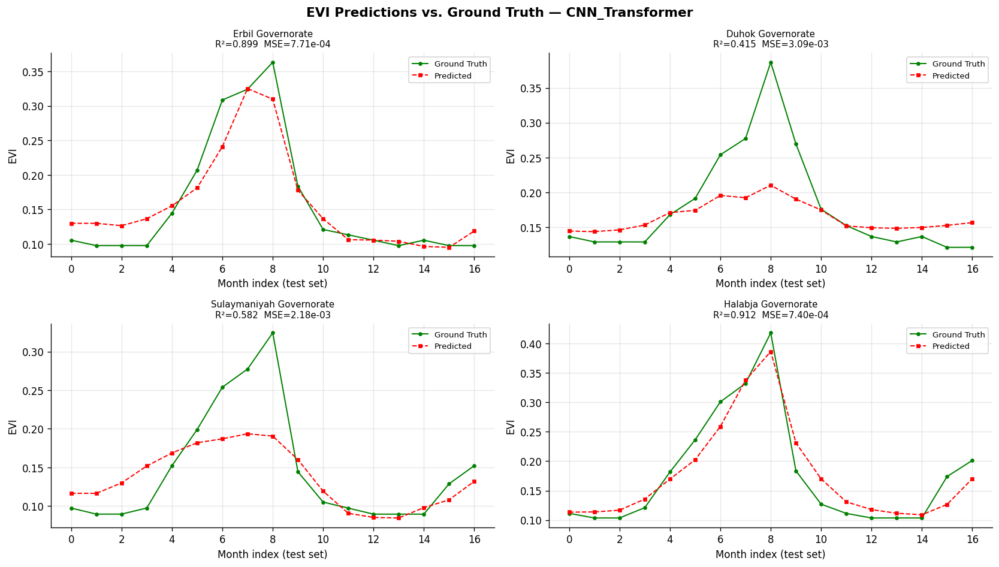

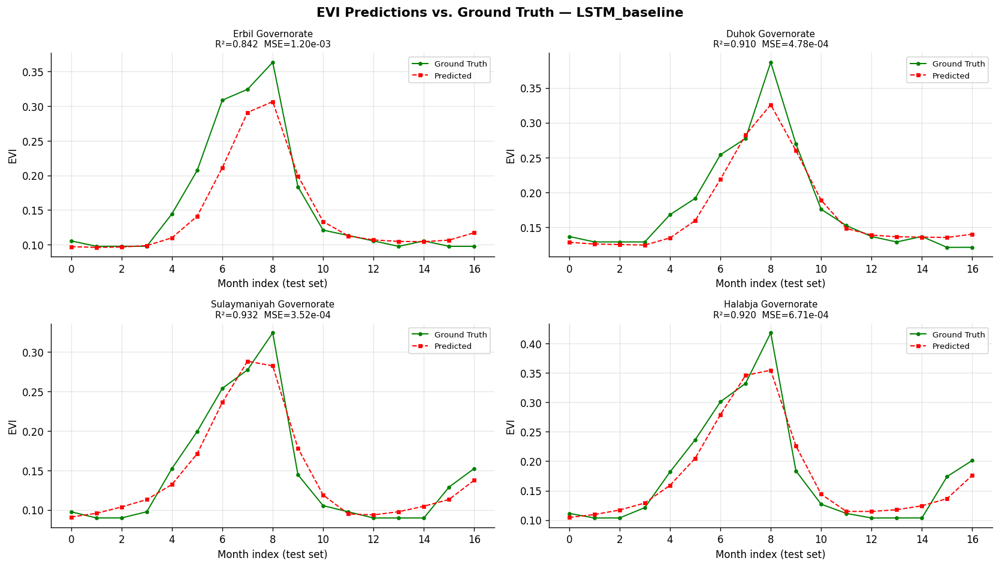

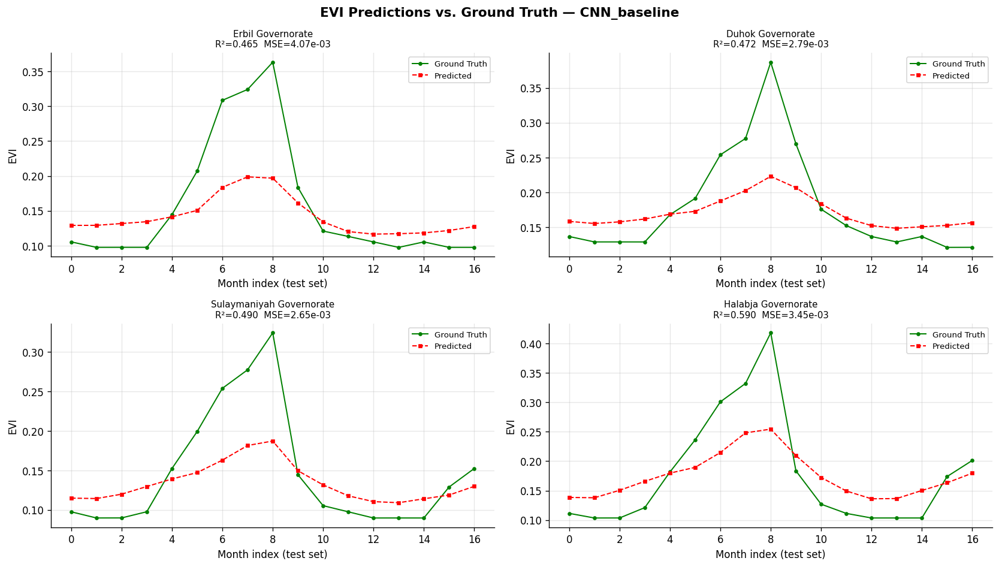

In [16]:
def plot_predictions_vs_truth(model_name: str):
    fig, axes = plt.subplots(2, 2, figsize=(14, 8))
    axes = axes.ravel()
    fig.suptitle(f'EVI Predictions vs. Ground Truth — {model_name}',
                 fontsize=13, fontweight='bold')
    for ax, region, rname, col in zip(axes, REGIONS, REGION_NAMES, COLORS):
        _, _, y_pred, y_true, metrics = all_results[model_name][region]
        x = np.arange(len(y_true))
        ax.plot(x, y_true, 'g-o', markersize=3, linewidth=1.2, label='Ground Truth')
        ax.plot(x, y_pred, 'r--s', markersize=3, linewidth=1.2, label='Predicted')
        ax.set_title(f'{rname}\nR²={metrics["R2"]:.3f}  MSE={metrics["MSE"]:.2e}',
                     fontsize=9)
        ax.set_xlabel('Month index (test set)'); ax.set_ylabel('EVI')
        ax.legend(fontsize=8); ax.grid(alpha=0.3)
    plt.tight_layout()
    plt.savefig(f'pred_vs_truth_{model_name}.png', dpi=130, bbox_inches='tight')
    plt.show()


for mn in MODEL_REGISTRY:
    plot_predictions_vs_truth(mn)


## Cell 23 — MC-Dropout Uncertainty on Test Set
Runs 50 stochastic forward passes per model to estimate predictive uncertainty.
Shaded bands show ±2σ.

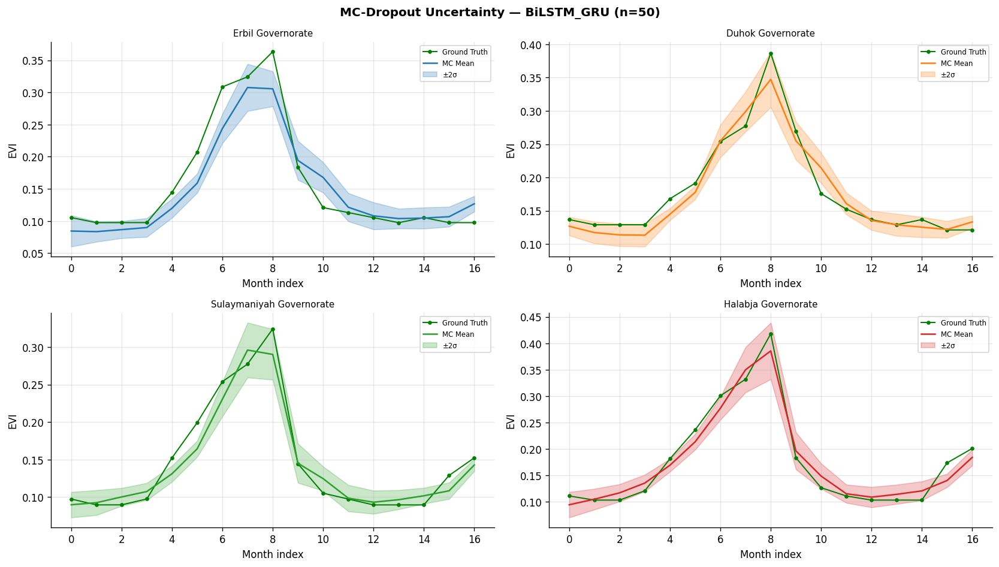

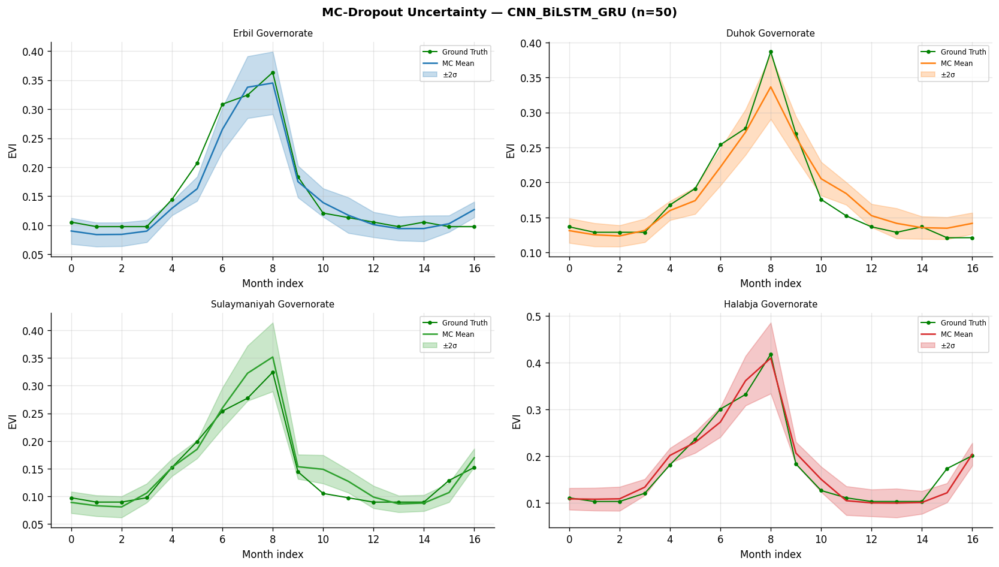

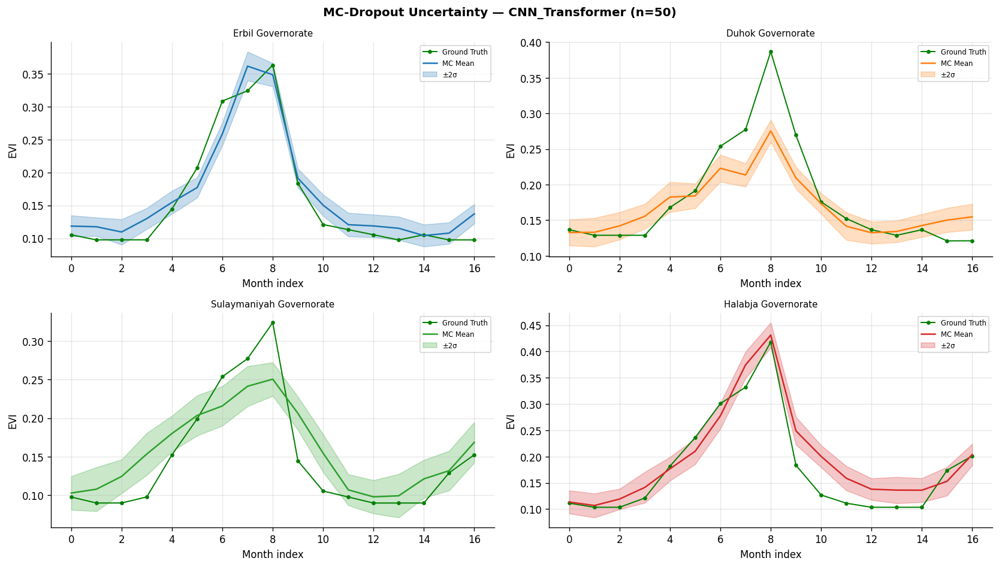

In [17]:
def mc_dropout_predict(model, X: np.ndarray, n_mc: int = 100):
    """n_mc stochastic forward passes with dropout active (training=True)."""
    preds = np.stack(
        [model(X, training=True).numpy().ravel() for _ in range(n_mc)], axis=0
    )
    return preds.mean(axis=0), preds.std(axis=0)


def plot_mc_uncertainty(model_name: str, n_mc: int = 50):
    fig, axes = plt.subplots(2, 2, figsize=(14, 8))
    axes = axes.ravel()
    fig.suptitle(f'MC-Dropout Uncertainty — {model_name} (n={n_mc})',
                 fontsize=12, fontweight='bold')
    _, seq_len, _ = MODEL_REGISTRY[model_name]

    for ax, region, rname, col in zip(axes, REGIONS, REGION_NAMES, COLORS):
        model, _, _, y_true, _ = all_results[model_name][region]
        _, _, _, X_te, _, _    = prepare_region_data(region, seq_len=seq_len,
                                                      batch_size=BATCH_SIZE)
        scaler                 = scalers_evi[region]
        mc_mean, mc_std        = mc_dropout_predict(model, X_te, n_mc=n_mc)
        mc_mean_evi = scaler.inverse_transform(mc_mean.reshape(-1, 1)).ravel()
        mc_std_evi  = mc_std * scaler.scale_[0]

        x = np.arange(len(y_true))
        ax.plot(x, y_true, 'g-o', markersize=3, linewidth=1.2,
                label='Ground Truth', zorder=3)
        ax.plot(x, mc_mean_evi, color=col, linewidth=1.5, label='MC Mean', zorder=4)
        ax.fill_between(x, mc_mean_evi - 2*mc_std_evi, mc_mean_evi + 2*mc_std_evi,
                        alpha=0.25, color=col, label='±2σ')
        ax.set_title(rname, fontsize=9)
        ax.set_xlabel('Month index'); ax.set_ylabel('EVI')
        ax.legend(fontsize=7); ax.grid(alpha=0.3)

    plt.tight_layout()
    plt.savefig(f'mc_dropout_{model_name}.png', dpi=130, bbox_inches='tight')
    plt.show()


plot_mc_uncertainty('BiLSTM_GRU',      n_mc=50)
plot_mc_uncertainty('CNN_BiLSTM_GRU',  n_mc=50)
plot_mc_uncertainty('CNN_Transformer', n_mc=50)


## Cell 24 — Rolling Time-Series Cross-Validation

In [18]:
def rolling_cross_validate(model_name: str, region: str,
                             n_splits: int = 4) -> list:
    """Walk-forward cross-validation using TimeSeriesSplit."""
    builder, seq_len, lr = MODEL_REGISTRY[model_name]
    X, y  = create_sequences_mv(region, seq_len)
    tscv  = TimeSeriesSplit(n_splits=n_splits)
    fold_r2 = []
    for train_idx, val_idx in tscv.split(X):
        m = builder(seq_len=seq_len)
        m.compile(optimizer=keras.optimizers.Adam(lr), loss='mse')
        m.fit(
            X[train_idx], y[train_idx],
            epochs=80, batch_size=16,
            validation_data=(X[val_idx], y[val_idx]),
            callbacks=[EarlyStopping(patience=10, restore_best_weights=True)],
            verbose=0
        )
        fold_r2.append(
            r2_score(y[val_idx], m.predict(X[val_idx], verbose=0).ravel())
        )
    return fold_r2


for mn in ('BiLSTM_GRU', 'CNN_Transformer'):
    print(f'Rolling CV — {mn}:')
    for region in REGIONS:
        folds = rolling_cross_validate(mn, region)
        print(f"  {region}: {[round(f,3) for f in folds]}  "
              f"Mean={np.mean(folds):.3f} ± {np.std(folds):.3f}")
    print()


Rolling CV — BiLSTM_GRU:
  Erbil: [0.848, 0.588, 0.664, 0.894]  Mean=0.748 ± 0.127
  Duhok: [0.695, 0.483, 0.664, 0.932]  Mean=0.693 ± 0.160
  Sulaymaniyah: [0.863, 0.285, 0.727, 0.928]  Mean=0.701 ± 0.251
  Halabja: [0.77, 0.723, 0.762, 0.942]  Mean=0.799 ± 0.084

Rolling CV — CNN_Transformer:
  Erbil: [-0.545, 0.168, 0.026, 0.76]  Mean=0.102 ± 0.464
  Duhok: [-0.149, -1.219, 0.809, 0.347]  Mean=-0.053 ± 0.754
  Sulaymaniyah: [0.343, -0.703, 0.519, 0.77]  Mean=0.232 ± 0.561
  Halabja: [0.056, 0.814, 0.651, 0.866]  Mean=0.597 ± 0.322



## Cell 25 — Future EVI Forecasting Engine
Auto-regressive MC-Dropout forecasting for 5-year (primary) and 10-year (scenario) horizons.
Climate inputs for future months are estimated from the historical seasonal climatology.
Uncertainty bands grow linearly from ×1.0 to ×2.5 to reflect compounding auto-regressive error.

In [19]:
FORECAST_5Y  = 60    # months: 2026-01 → 2030-12
FORECAST_10Y = 120   # months: 2026-01 → 2035-12
FORECAST_START = '2026-01-01'

FORECAST_DATES_5Y  = pd.date_range(FORECAST_START, periods=FORECAST_5Y,  freq='MS')
FORECAST_DATES_10Y = pd.date_range(FORECAST_START, periods=FORECAST_10Y, freq='MS')


def forecast_future_evi(model_name: str, region: str,
                         n_future: int = FORECAST_5Y,
                         n_mc: int = 100) -> dict:
    """
    Auto-regressive multi-step forecast with MC-Dropout uncertainty.
    Climate features for future steps use historical seasonal climatology.
    Returns {'mean': np.ndarray, 'lower': np.ndarray, 'upper': np.ndarray}.
    """
    builder, seq_len, _ = MODEL_REGISTRY[model_name]
    model   = all_results[model_name][region][0]
    scaler  = scalers_evi[region]

    # Climatological climate means per calendar month
    feat_hist   = build_feature_matrix(region)
    clim_precip = {mo: feat_hist['precip'][feat_hist.index.month == mo].mean()
                   for mo in range(1, 13)}
    clim_temp   = {mo: feat_hist['temp'][feat_hist.index.month == mo].mean()
                   for mo in range(1, 13)}

    seed_feats   = feat_hist.values[-seq_len:].copy()
    all_mc_preds = []

    for _ in range(n_mc):
        feats      = seed_feats.copy()
        preds_norm = []
        for step in range(n_future):
            X_in  = feats[-seq_len:][np.newaxis]              # (1, seq_len, 5)
            y_hat = model(X_in, training=True).numpy().ravel()[0]
            preds_norm.append(y_hat)
            future_date = (
                datetime.strptime(FORECAST_START, '%Y-%m-%d')
                + relativedelta(months=step)
            )
            mo = future_date.month
            next_feat = np.array([
                y_hat,
                clim_precip[mo],
                clim_temp[mo],
                np.sin(2 * np.pi * mo / 12),
                np.cos(2 * np.pi * mo / 12),
            ])
            feats = np.vstack([feats, next_feat])
        all_mc_preds.append(preds_norm)

    all_mc       = np.array(all_mc_preds)          # (n_mc, n_future)
    mc_mean_norm = all_mc.mean(axis=0)
    mc_std_norm  = all_mc.std(axis=0)

    mc_mean_evi = scaler.inverse_transform(
        mc_mean_norm.reshape(-1, 1)).ravel()

    # Growing uncertainty envelope (reflects compounding error)
    grow = np.linspace(1.0, 2.5, n_future)
    mc_std_evi = mc_std_norm * scaler.scale_[0] * grow

    mc_mean_evi = np.clip(mc_mean_evi, 0.05, 0.70)
    lower       = np.clip(mc_mean_evi - 2 * mc_std_evi, 0.01, 0.80)
    upper       = np.clip(mc_mean_evi + 2 * mc_std_evi, 0.01, 0.80)
    return {'mean': mc_mean_evi, 'lower': lower, 'upper': upper}


# 5-year forecasts — all primary models
print('Computing 5-year forecasts (2026–2030) …')
future_5y = {}
for model_name in PRIMARY_MODELS:
    future_5y[model_name] = {}
    for region in REGIONS:
        future_5y[model_name][region] = forecast_future_evi(
            model_name, region, n_future=FORECAST_5Y, n_mc=100)
        print(f'  ✓ {model_name} | {region}')

# 10-year forecast — best overall model only
best_overall = results_df.groupby('Model')['R2'].mean().idxmax()
print(f'\nComputing 10-year forecasts (2026–2035) — best model: {best_overall} …')
future_10y = {}
for region in REGIONS:
    future_10y[region] = forecast_future_evi(
        best_overall, region, n_future=FORECAST_10Y, n_mc=100)
    print(f'  ✓ {region}')

print('\n✓ All forecasts computed.')


Computing 5-year forecasts (2026–2030) …
  ✓ BiLSTM | Erbil
  ✓ BiLSTM | Duhok
  ✓ BiLSTM | Sulaymaniyah
  ✓ BiLSTM | Halabja
  ✓ GRU | Erbil
  ✓ GRU | Duhok
  ✓ GRU | Sulaymaniyah
  ✓ GRU | Halabja
  ✓ CNN_GRU | Erbil
  ✓ CNN_GRU | Duhok
  ✓ CNN_GRU | Sulaymaniyah
  ✓ CNN_GRU | Halabja
  ✓ CNN_BiLSTM | Erbil
  ✓ CNN_BiLSTM | Duhok
  ✓ CNN_BiLSTM | Sulaymaniyah
  ✓ CNN_BiLSTM | Halabja
  ✓ BiLSTM_GRU | Erbil
  ✓ BiLSTM_GRU | Duhok
  ✓ BiLSTM_GRU | Sulaymaniyah
  ✓ BiLSTM_GRU | Halabja
  ✓ CNN_BiLSTM_GRU | Erbil
  ✓ CNN_BiLSTM_GRU | Duhok
  ✓ CNN_BiLSTM_GRU | Sulaymaniyah
  ✓ CNN_BiLSTM_GRU | Halabja
  ✓ TCN | Erbil
  ✓ TCN | Duhok
  ✓ TCN | Sulaymaniyah
  ✓ TCN | Halabja
  ✓ Transformer | Erbil
  ✓ Transformer | Duhok
  ✓ Transformer | Sulaymaniyah
  ✓ Transformer | Halabja
  ✓ CNN_Transformer | Erbil
  ✓ CNN_Transformer | Duhok
  ✓ CNN_Transformer | Sulaymaniyah
  ✓ CNN_Transformer | Halabja

Computing 10-year forecasts (2026–2035) — best model: BiLSTM …
  ✓ Erbil
  ✓ Duhok
  ✓ Sulaym

## Cell 26 — 5-Year Forecast Plots (per model)

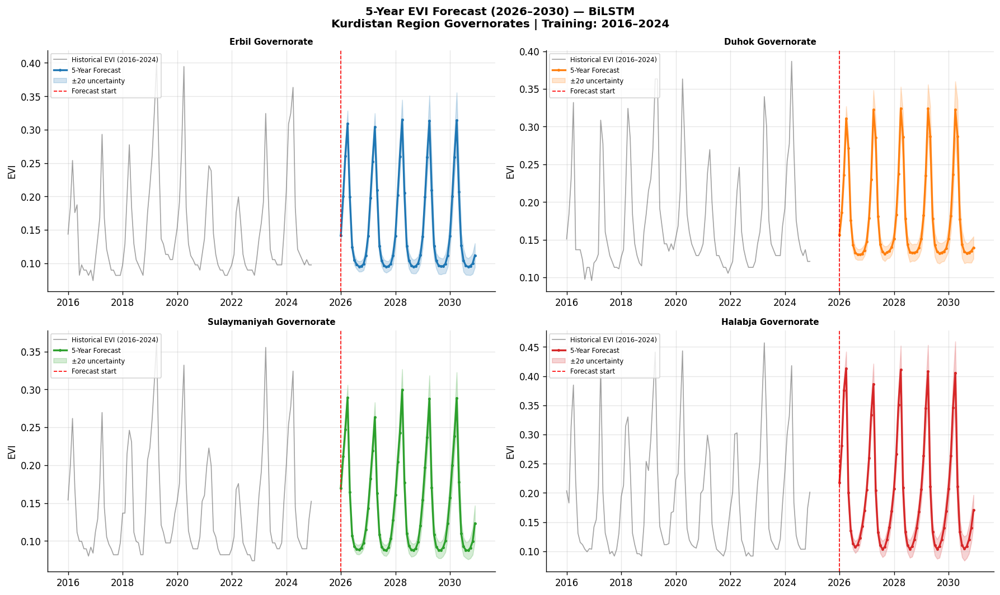

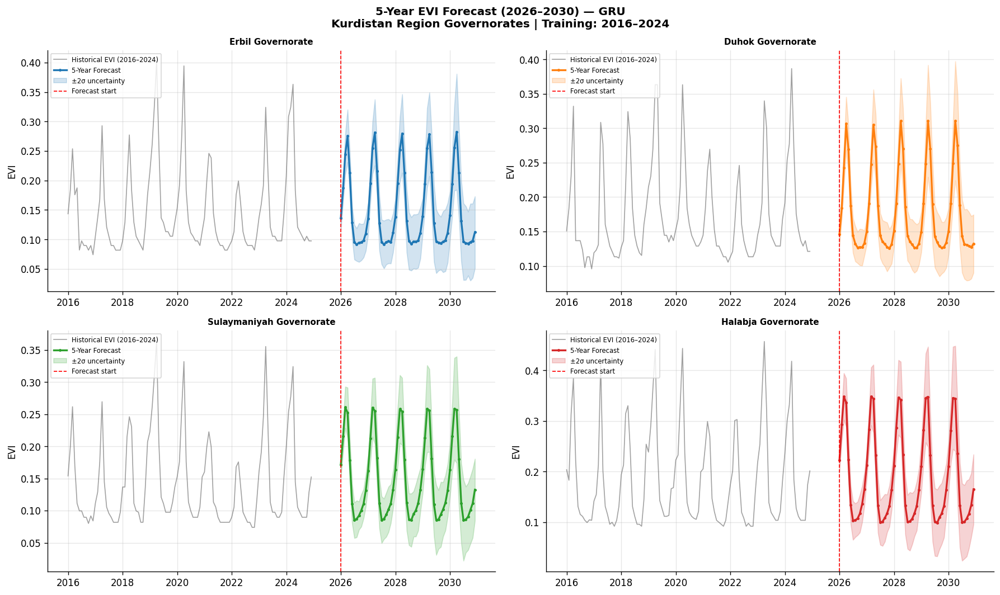

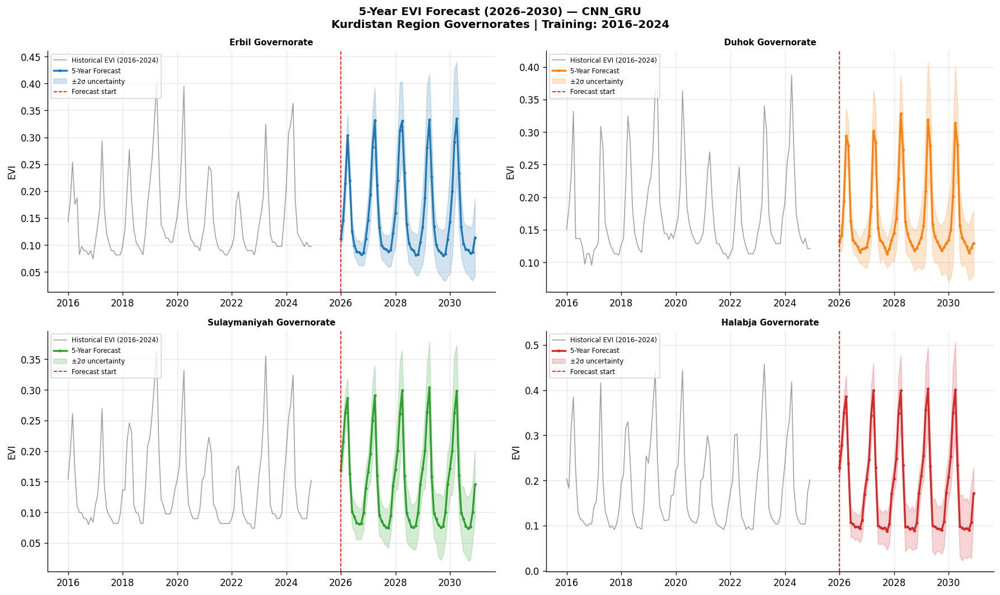

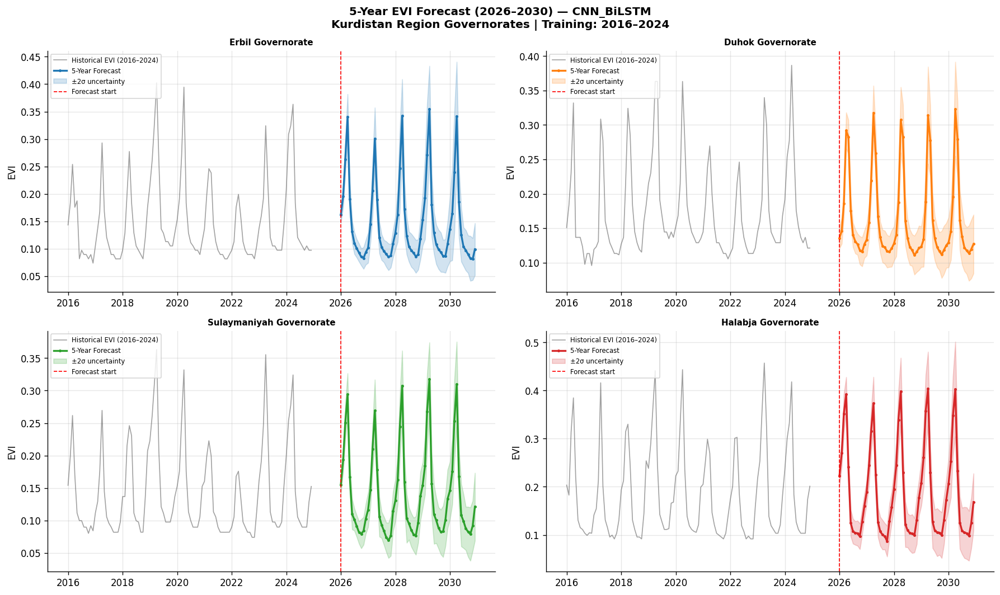

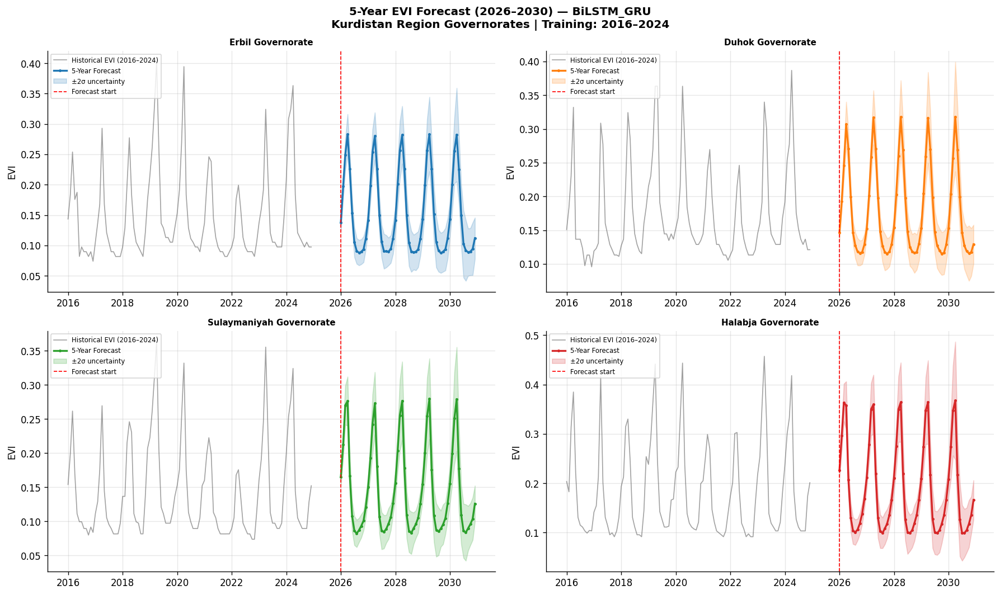

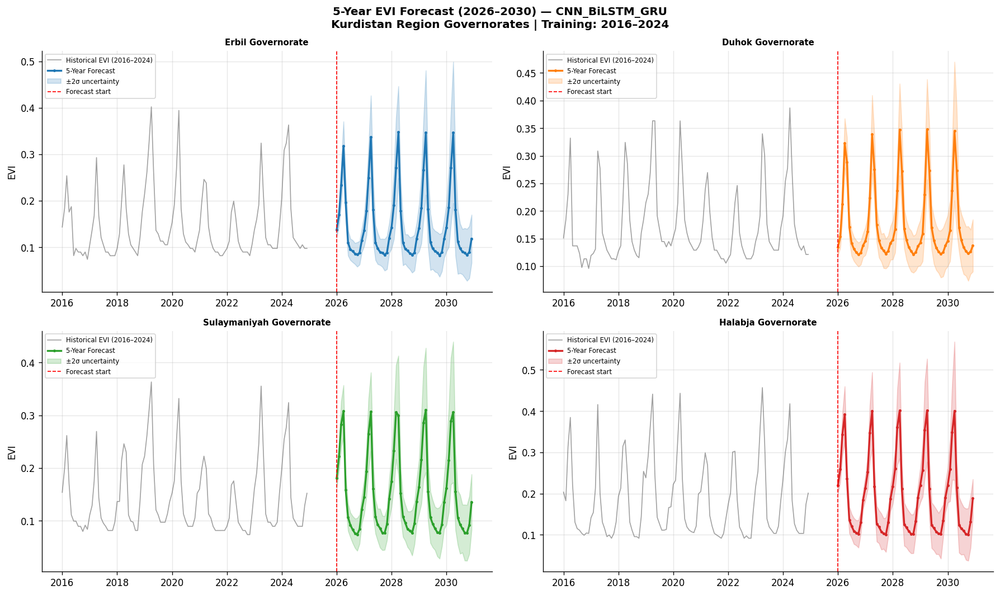

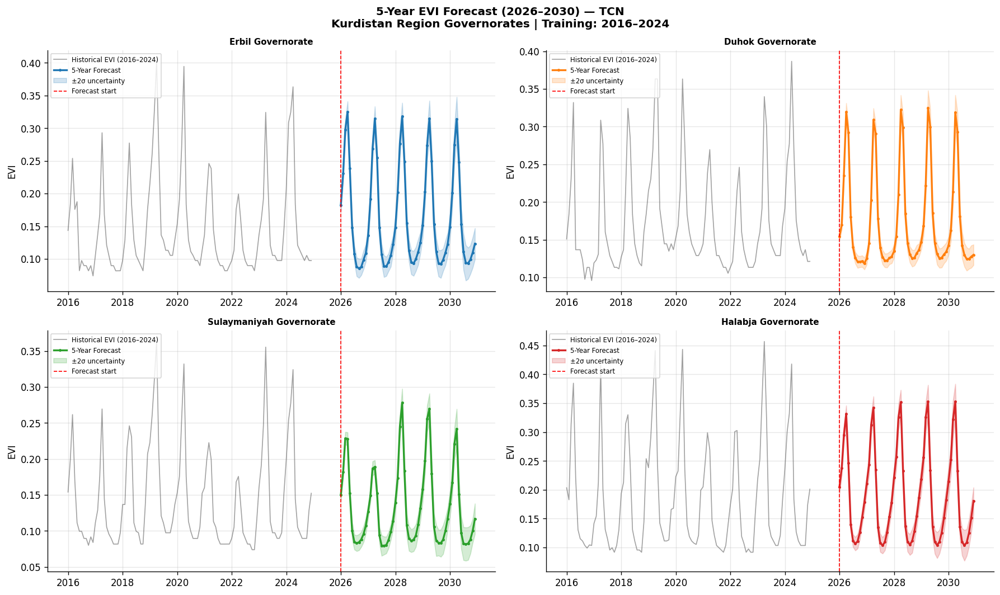

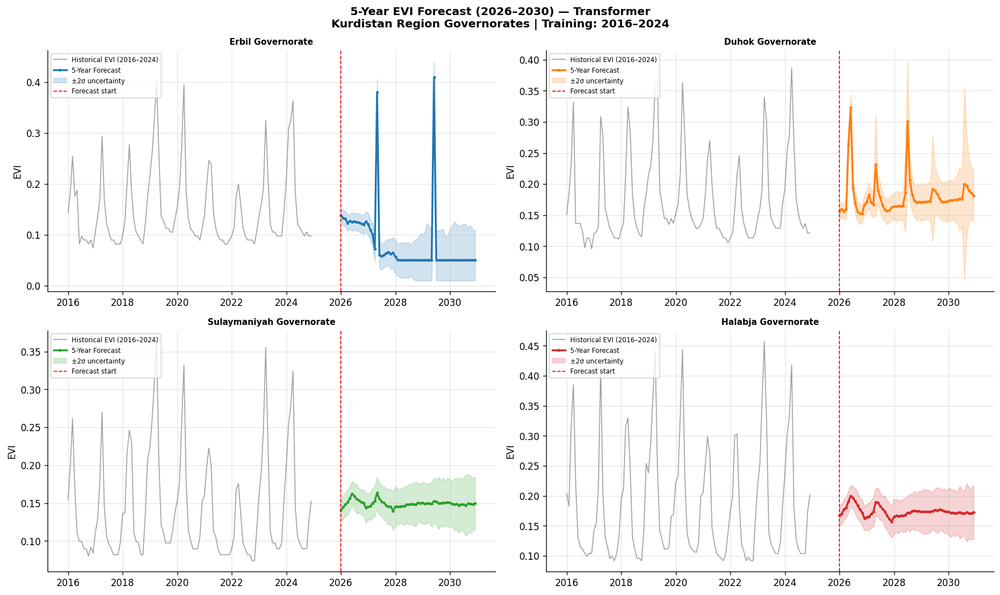

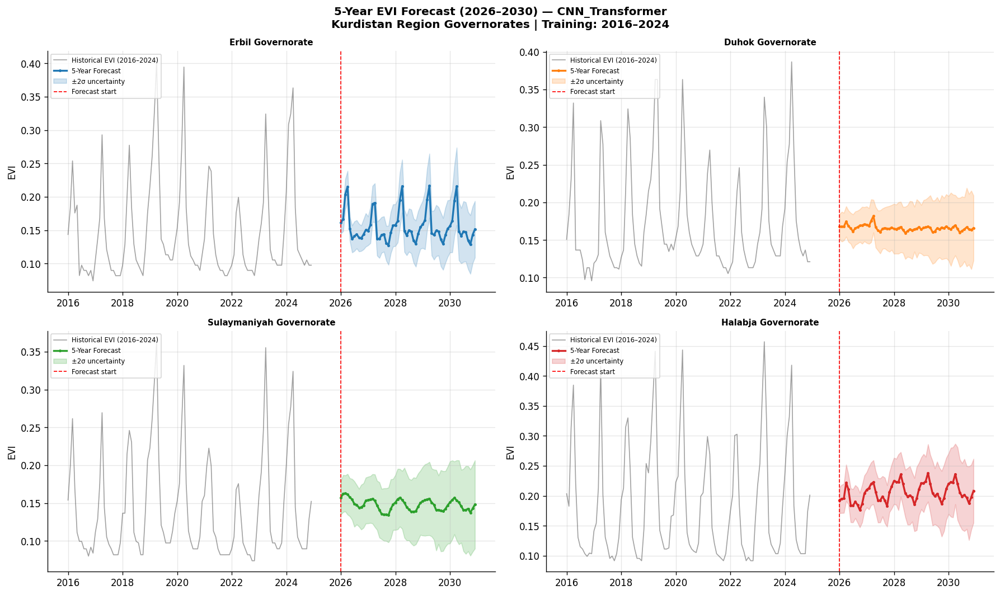

In [20]:
def plot_5y_forecast(model_name: str):
    fig, axes = plt.subplots(2, 2, figsize=(15, 9))
    axes = axes.ravel()
    fig.suptitle(
        f'5-Year EVI Forecast (2026–2030) — {model_name}\n'
        'Kurdistan Region Governorates | Training: 2016–2024',
        fontsize=12, fontweight='bold'
    )
    for ax, region, rname, col in zip(axes, REGIONS, REGION_NAMES, COLORS):
        ax.plot(evi_df.index, evi_df[region],
                color='#555555', linewidth=1, alpha=0.55,
                label='Historical EVI (2016–2024)')
        fc = future_5y[model_name][region]
        ax.plot(FORECAST_DATES_5Y, fc['mean'], color=col,
                linewidth=2, marker='o', markersize=2, label='5-Year Forecast')
        ax.fill_between(FORECAST_DATES_5Y, fc['lower'], fc['upper'],
                        alpha=0.20, color=col, label='±2σ uncertainty')
        ax.axvline(pd.Timestamp(FORECAST_START), color='red',
                   linestyle='--', linewidth=1, label='Forecast start')
        ax.set_title(rname, fontsize=9, fontweight='bold')
        ax.set_ylabel('EVI')
        ax.xaxis.set_major_formatter(mdates.DateFormatter('%Y'))
        ax.grid(alpha=0.3)
        ax.legend(fontsize=7, loc='upper left')
    plt.tight_layout()
    plt.savefig(f'forecast_5y_{model_name}.png', dpi=130, bbox_inches='tight')
    plt.show()


for mn in PRIMARY_MODELS:
    plot_5y_forecast(mn)


## Cell 27 — 10-Year Forecast Plot (best model)
Shows both the 5-year (solid, narrower CI) and 10-year (dashed, growing CI) forecasts
together. The 10-year window is clearly labelled as exploratory.

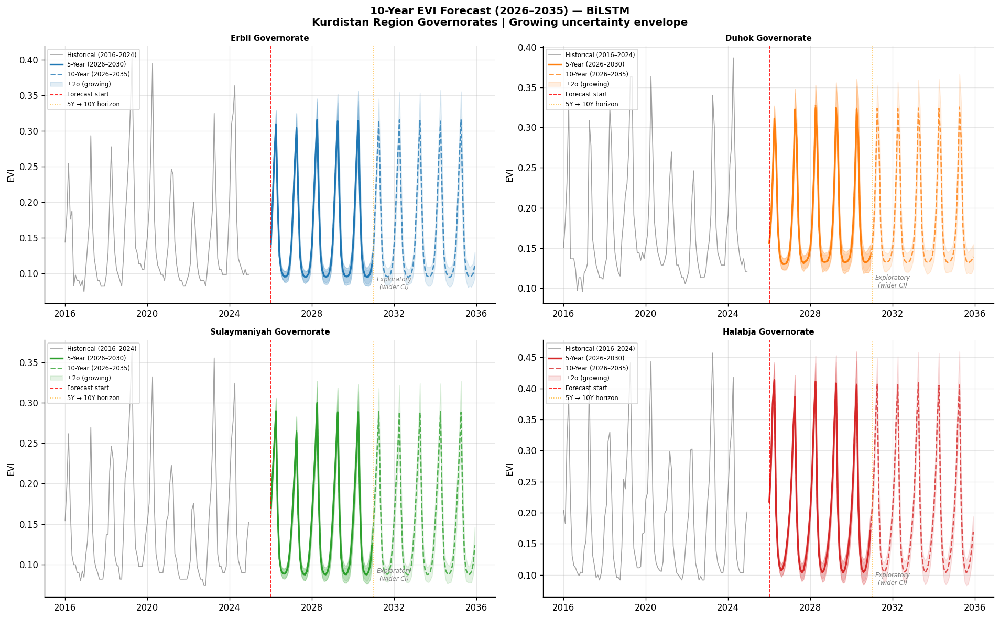

Saved: forecast_10y_best_model.png  (model: BiLSTM)


In [21]:
fig, axes = plt.subplots(2, 2, figsize=(16, 10))
axes = axes.ravel()
fig.suptitle(
    f'10-Year EVI Forecast (2026–2035) — {best_overall}\n'
    'Kurdistan Region Governorates | Growing uncertainty envelope',
    fontsize=12, fontweight='bold'
)

for ax, region, rname, col in zip(axes, REGIONS, REGION_NAMES, COLORS):
    ax.plot(evi_df.index, evi_df[region],
            color='#555555', linewidth=1, alpha=0.55, label='Historical (2016–2024)')

    fc5 = future_5y[best_overall][region]
    ax.plot(FORECAST_DATES_5Y, fc5['mean'], color=col,
            linewidth=2, label='5-Year (2026–2030)')
    ax.fill_between(FORECAST_DATES_5Y, fc5['lower'], fc5['upper'],
                    alpha=0.25, color=col)

    fc10 = future_10y[region]
    ax.plot(FORECAST_DATES_10Y, fc10['mean'], color=col,
            linewidth=1.5, linestyle='--', alpha=0.8, label='10-Year (2026–2035)')
    ax.fill_between(FORECAST_DATES_10Y, fc10['lower'], fc10['upper'],
                    alpha=0.12, color=col, label='±2σ (growing)')

    ax.axvline(pd.Timestamp(FORECAST_START), color='red',
               linestyle='--', linewidth=1, label='Forecast start')
    ax.axvline(pd.Timestamp('2031-01-01'), color='orange',
               linestyle=':', linewidth=1, alpha=0.7, label='5Y → 10Y horizon')
    ax.text(pd.Timestamp('2032-01-01'), ax.get_ylim()[0] + 0.02,
            'Exploratory\n(wider CI)', fontsize=7, color='gray',
            ha='center', style='italic')

    ax.set_title(rname, fontsize=9, fontweight='bold')
    ax.set_ylabel('EVI')
    ax.xaxis.set_major_formatter(mdates.DateFormatter('%Y'))
    ax.grid(alpha=0.3)
    ax.legend(fontsize=7, loc='upper left')

plt.tight_layout()
plt.savefig('forecast_10y_best_model.png', dpi=150, bbox_inches='tight')
plt.show()
print(f'Saved: forecast_10y_best_model.png  (model: {best_overall})')


## Cell 28 — Cross-Model 5-Year Forecast Comparison Grid

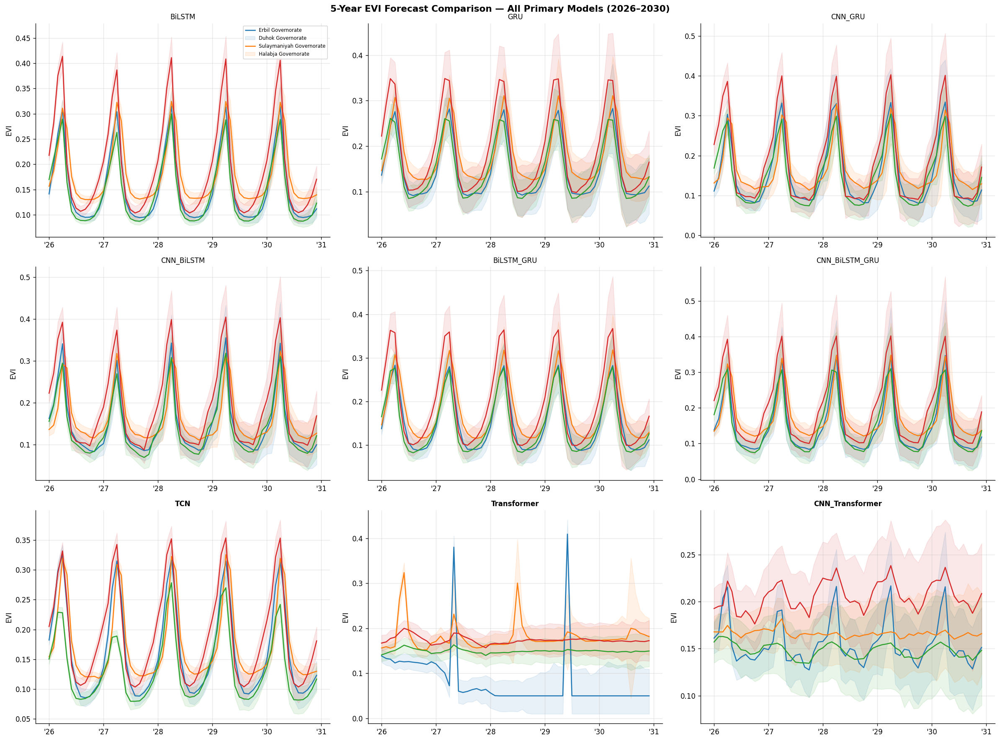

Saved: forecast_comparison_all_models.png


In [22]:
n_models = len(PRIMARY_MODELS)
n_cols   = 3
n_rows   = (n_models + n_cols - 1) // n_cols

fig, axes = plt.subplots(n_rows, n_cols, figsize=(20, n_rows * 5))
axes = axes.ravel()
fig.suptitle('5-Year EVI Forecast Comparison — All Primary Models (2026–2030)',
             fontsize=13, fontweight='bold')

for ax, model_name in zip(axes, PRIMARY_MODELS):
    for region, col, lbl in zip(REGIONS, COLORS, REGION_NAMES):
        fc = future_5y[model_name][region]
        ax.plot(FORECAST_DATES_5Y, fc['mean'], color=col, linewidth=1.5, label=lbl)
        ax.fill_between(FORECAST_DATES_5Y, fc['lower'], fc['upper'],
                        alpha=0.10, color=col)
    ax.set_title(
        model_name, fontsize=10,
        fontweight='bold' if model_name in ('TCN','Transformer','CNN_Transformer')
        else 'normal'
    )
    ax.set_ylabel('EVI')
    ax.xaxis.set_major_formatter(mdates.DateFormatter("'%y"))
    ax.grid(alpha=0.3)

for ax in axes[n_models:]:
    ax.set_visible(False)

axes[0].legend(REGION_NAMES, fontsize=7, loc='upper right')
plt.tight_layout()
plt.savefig('forecast_comparison_all_models.png', dpi=150, bbox_inches='tight')
plt.show()
print('Saved: forecast_comparison_all_models.png')


## Cell 29 — Save All Outputs to CSV

In [23]:
# Model metrics
results_df.to_csv('evi_model_metrics.csv', index=False)
print('Saved: evi_model_metrics.csv')

# Historical data
evi_df.to_csv('evi_historical_2016_202.csv')
precip_df.to_csv('precip_historical_2016_2024.csv')
temp_df.to_csv('temp_historical_2016_2024.csv')
print('Saved: evi / precip / temp historical CSVs')

# 5-year forecasts (all primary models)
fc5_rows = []
for model_name in PRIMARY_MODELS:
    for region in REGIONS:
        fc = future_5y[model_name][region]
        for date, mv, lo, hi in zip(FORECAST_DATES_5Y,
                                    fc['mean'], fc['lower'], fc['upper']):
            fc5_rows.append({
                'Model': model_name, 'Region': region, 'Date': date,
                'EVI_Mean':  round(float(mv), 6),
                'EVI_Lower': round(float(lo), 6),
                'EVI_Upper': round(float(hi), 6),
            })
pd.DataFrame(fc5_rows).to_csv('evi_forecasts_5year_2026_2030.csv', index=False)
print('Saved: evi_forecasts_5year_2026_2030.csv')

# 10-year forecasts (best model)
fc10_rows = []
for region in REGIONS:
    fc = future_10y[region]
    for date, mv, lo, hi in zip(FORECAST_DATES_10Y,
                                fc['mean'], fc['lower'], fc['upper']):
        fc10_rows.append({
            'Model': best_overall, 'Region': region, 'Date': date,
            'EVI_Mean':  round(float(mv), 6),
            'EVI_Lower': round(float(lo), 6),
            'EVI_Upper': round(float(hi), 6),
        })
pd.DataFrame(fc10_rows).to_csv('evi_forecasts_10year_2026_2035.csv', index=False)
print('Saved: evi_forecasts_10year_2026_2035.csv')

print('\n✓ All outputs saved successfully.')
print('\nOutput files summary:')
print('  study_area_map.png                   — governorate shapefile map')
print('  evi_climate_timeseries.png           — EVI + precip + temp 2016–2024')
print('  evi_annual_statistics.png            — annual stats 4-panel')
print('  evi_model_comparison.png             — R², MSE, MAE, accuracy bar charts')
print('  loss_<model>.png                     — training curves (11 files)')
print('  pred_vs_truth_<model>.png            — predictions vs truth (11 files)')
print('  mc_dropout_<model>.png               — MC uncertainty test set (3 files)')
print('  forecast_5y_<model>.png              — 5-year forecast per model')
print('  forecast_10y_best_model.png          — 10-year forecast, best model')
print('  forecast_comparison_all_models.png  — cross-model 5Y grid')
print('  evi_model_metrics.csv')
print('  evi_historical_2016_2024.csv')
print('  precip_historical_2016_2024.csv')
print('  temp_historical_2016_2024.csv')
print('  evi_forecasts_5year_2026_2030.csv')
print(f' evi_forecasts_10year_2026_2035.csv  (model: {best_overall})')


Saved: evi_model_metrics.csv
Saved: evi / precip / temp historical CSVs
Saved: evi_forecasts_5year_2026_2030.csv
Saved: evi_forecasts_10year_2026_2035.csv

✓ All outputs saved successfully.

Output files summary:
  study_area_map.png                   — governorate shapefile map
  evi_climate_timeseries.png           — EVI + precip + temp 2016–2024
  evi_annual_statistics.png            — annual stats 4-panel
  evi_model_comparison.png             — R², MSE, MAE, accuracy bar charts
  loss_<model>.png                     — training curves (11 files)
  pred_vs_truth_<model>.png            — predictions vs truth (11 files)
  mc_dropout_<model>.png               — MC uncertainty test set (3 files)
  forecast_5y_<model>.png              — 5-year forecast per model
  forecast_10y_best_model.png          — 10-year forecast, best model
  forecast_comparison_all_models.png  — cross-model 5Y grid
  evi_model_metrics.csv
  evi_historical_2016_2024.csv
  precip_historical_2016_2024.csv
  temp_his

In [24]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [25]:
import os
import shutil

DRIVE_FOLDER_NAME = 'EVI_Forecast_Results'  # <---- Customize your folder name here
DRIVE_FOLDER_PATH = f'/content/drive/MyDrive/{DRIVE_FOLDER_NAME}'

# Create the folder if it doesn't exist
os.makedirs(DRIVE_FOLDER_PATH, exist_ok=True)
print(f"Google Drive folder '{DRIVE_FOLDER_PATH}' ensured.")

# List of files to move
files_to_move = [
    'study_area_map.png',
    'evi_climate_timeseries.png',
    'evi_annual_statistics.png',
    'evi_model_comparison.png',
    'forecast_10y_best_model.png',
    'forecast_comparison_all_models.png',
    'evi_model_metrics.csv',
    'evi_historical_2016_2024.csv',
    'precip_historical_2016_2024.csv',
    'temp_historical_2016_2024.csv',
    'evi_forecasts_5year_2026_2030.csv',
    'evi_forecasts_10year_2026_2035.csv'
]

# Add model-specific plots (loss, pred_vs_truth, mc_dropout)
# These variables were generated in Cell 18, 19, 21 and 22.
# Using the variable names from the notebook state.

# `MODEL_REGISTRY` contains all model names
for mn in MODEL_REGISTRY:
    files_to_move.append(f'loss_{mn}.png')
    files_to_move.append(f'pred_vs_truth_{mn}.png')

# `mc_dropout` plots were generated only for selected models
files_to_move.append('mc_dropout_BiLSTM_GRU.png')
files_to_move.append('mc_dropout_CNN_BiLSTM_GRU.png')
files_to_move.append('mc_dropout_CNN_Transformer.png')

moved_count = 0
for f_name in files_to_move:
    source_path = os.path.join('.', f_name)
    target_path = os.path.join(DRIVE_FOLDER_PATH, f_name)
    if os.path.exists(source_path):
        shutil.move(source_path, target_path)
        print(f"  Moved '{f_name}'")
        moved_count += 1
    else:
        print(f"  Skipped '{f_name}' (not found)")

print(f"\n✓ Moved {moved_count} files to '{DRIVE_FOLDER_PATH}' in Google Drive.")

Google Drive folder '/content/drive/MyDrive/EVI_Forecast_Results' ensured.
  Skipped 'study_area_map.png' (not found)
  Moved 'evi_climate_timeseries.png'
  Moved 'evi_annual_statistics.png'
  Moved 'evi_model_comparison.png'
  Moved 'forecast_10y_best_model.png'
  Moved 'forecast_comparison_all_models.png'
  Moved 'evi_model_metrics.csv'
  Skipped 'evi_historical_2016_2024.csv' (not found)
  Moved 'precip_historical_2016_2024.csv'
  Moved 'temp_historical_2016_2024.csv'
  Moved 'evi_forecasts_5year_2026_2030.csv'
  Moved 'evi_forecasts_10year_2026_2035.csv'
  Moved 'loss_BiLSTM.png'
  Moved 'pred_vs_truth_BiLSTM.png'
  Moved 'loss_GRU.png'
  Moved 'pred_vs_truth_GRU.png'
  Moved 'loss_CNN_GRU.png'
  Moved 'pred_vs_truth_CNN_GRU.png'
  Moved 'loss_CNN_BiLSTM.png'
  Moved 'pred_vs_truth_CNN_BiLSTM.png'
  Moved 'loss_BiLSTM_GRU.png'
  Moved 'pred_vs_truth_BiLSTM_GRU.png'
  Moved 'loss_CNN_BiLSTM_GRU.png'
  Moved 'pred_vs_truth_CNN_BiLSTM_GRU.png'
  Moved 'loss_TCN.png'
  Moved 'pred_vs_t

In [1]:
"""
Figure 3.1 — Monthly EVI, Precipitation & Temperature Time Series (2016–2024)
Figure 3.2 — Annual EVI Statistics (2016–2024)
Kurdistan Region of Iraq — Four Governorates

Run this script from the folder that contains:
    evi_climate_kurdistan_2016_2024.csv

Outputs:
    figure_3_1_monthly_timeseries.png
    figure_3_2_annual_statistics.png
"""

import csv
import os
from collections import defaultdict
from datetime import datetime

import matplotlib
import matplotlib.pyplot as plt
import matplotlib.dates as mdates
import matplotlib.patches as mpatches
import numpy as np

# ══════════════════════════════════════════════════════════════════
# 0.  CONFIGURATION
# ══════════════════════════════════════════════════════════════════
CSV_PATH = "evi_climate_kurdistan_2016_2024.csv"

# Explicit region order — CRITICAL: must match throughout
REGIONS = ["Erbil", "Duhok", "Sulaymaniyah", "Halabja"]

# Colour palette (colourblind-friendly)
COLORS = {
    "Erbil":        "#2196F3",   # blue
    "Duhok":        "#4CAF50",   # green
    "Sulaymaniyah": "#FF9800",   # orange
    "Halabja":      "#E91E63",   # pink/red
}

DPI = 300

# ══════════════════════════════════════════════════════════════════
# 1.  LOAD & CLEAN DATA
# ══════════════════════════════════════════════════════════════════
def load_data(csv_path):
    """
    Returns a dict keyed by region, each value a list of dicts:
        { 'date': datetime, 'evi': float|None,
          'precip': float|None, 'temp': float|None }
    Sorted by date.
    """
    raw = defaultdict(list)
    with open(csv_path, newline="", encoding="utf-8") as f:
        reader = csv.DictReader(f)
        for row in reader:
            region = row["region"].strip()
            # Parse date — format is M/D/YYYY
            date = datetime.strptime(row["date"].strip(), "%m/%d/%Y")
            evi    = float(row["evi_mean"])    if row["evi_mean"].strip()    else None
            precip = float(row["precip_mm"])   if row["precip_mm"].strip()   else None
            temp   = float(row["temp_c"])      if row["temp_c"].strip()      else None
            raw[region].append({"date": date, "evi": evi,
                                 "precip": precip, "temp": temp})

    # Sort each region by date
    for region in raw:
        raw[region].sort(key=lambda x: x["date"])

    return raw


data = load_data(CSV_PATH)

# Verify all four regions loaded
for r in REGIONS:
    n_evi = sum(1 for d in data[r] if d["evi"] is not None)
    print(f"  {r}: {len(data[r])} months total, {n_evi} with valid EVI")


# ── Helper: extract arrays for a region ──────────────────────────
def arrays(region, key):
    """Return (dates, values) for a given key, skipping None values."""
    pts = [(d["date"], d[key]) for d in data[region] if d[key] is not None]
    if not pts:
        return [], []
    dates, vals = zip(*pts)
    return list(dates), list(vals)


# ══════════════════════════════════════════════════════════════════
# 2.  FIGURE 3.1 — MONTHLY TIME SERIES
# ══════════════════════════════════════════════════════════════════
fig, axes = plt.subplots(3, 1, figsize=(14, 11), sharex=True)
fig.suptitle(
    "Monthly EVI, Precipitation and Temperature (2016–2024)\n"
    "Kurdistan Region of Iraq — Four Governorates",
    fontsize=13, fontweight="bold", y=0.98
)

# ── Panel 1: EVI ─────────────────────────────────────────────────
ax1 = axes[0]
for r in REGIONS:
    dates, vals = arrays(r, "evi")
    ax1.plot(dates, vals, color=COLORS[r], linewidth=1.6,
             label=r, alpha=0.9)

ax1.set_ylabel("EVI (mean)", fontsize=10)
ax1.set_ylim(0.05, 0.52)
ax1.set_title("(a)  Enhanced Vegetation Index", fontsize=10, loc="left", pad=4)
ax1.grid(True, alpha=0.25, linestyle="--")
ax1.legend(loc="upper left", fontsize=9, framealpha=0.85,
           ncol=2, columnspacing=1.0)
ax1.axhline(0, color="grey", lw=0.5)

# ── Panel 2: Precipitation ────────────────────────────────────────
ax2 = axes[1]
# Use bar chart for precipitation — use Erbil as representative
# (all regions share the same TerraClimate grid cell at ~4 km so values differ slightly)
bar_width = 20   # days width for bar
for r in REGIONS:
    dates, vals = arrays(r, "precip")
    # Offset bars slightly so they don't fully overlap
    offset = REGIONS.index(r) * 3
    ax2.bar([d + __import__("datetime").timedelta(days=offset) for d in dates],
            vals, width=bar_width // len(REGIONS),
            color=COLORS[r], alpha=0.75, label=r)

ax2.set_ylabel("Precipitation (mm)", fontsize=10)
ax2.set_title("(b)  Monthly Precipitation", fontsize=10, loc="left", pad=4)
ax2.grid(True, alpha=0.25, linestyle="--", axis="y")
ax2.legend(loc="upper right", fontsize=9, framealpha=0.85, ncol=2)

# ── Panel 3: Temperature ──────────────────────────────────────────
ax3 = axes[2]
for r in REGIONS:
    dates, vals = arrays(r, "temp")
    ax3.plot(dates, vals, color=COLORS[r], linewidth=1.6,
             label=r, alpha=0.9)

ax3.set_ylabel("Temperature (°C)", fontsize=10)
ax3.set_title("(c)  Mean Air Temperature", fontsize=10, loc="left", pad=4)
ax3.grid(True, alpha=0.25, linestyle="--")
ax3.legend(loc="upper left", fontsize=9, framealpha=0.85, ncol=2)

# ── Shared x-axis formatting ──────────────────────────────────────
ax3.xaxis.set_major_locator(mdates.YearLocator())
ax3.xaxis.set_major_formatter(mdates.DateFormatter("%Y"))
ax3.xaxis.set_minor_locator(mdates.MonthLocator(bymonth=[4, 7, 10]))
plt.setp(ax3.get_xticklabels(), rotation=0, ha="center", fontsize=9)
ax3.set_xlabel("Date", fontsize=10)

# Shade drought year 2022 across all panels
import datetime as dt
drought_start = dt.datetime(2022, 1, 1)
drought_end   = dt.datetime(2022, 12, 31)
for ax in axes:
    ax.axvspan(drought_start, drought_end,
               color="#FFCCCC", alpha=0.35, zorder=0, label="_2022 drought")
    ax.axvline(drought_start, color="#CC0000", lw=0.8, linestyle=":", alpha=0.6)

# Add drought annotation on EVI panel
ax1.annotate("2022\nDrought", xy=(dt.datetime(2022, 6, 1), 0.47),
             fontsize=8, color="#CC0000", ha="center", fontstyle="italic")

plt.tight_layout(rect=[0, 0, 1, 0.97])
out1 = "figure_3_1_monthly_timeseries.png"
plt.savefig(out1, dpi=DPI, bbox_inches="tight", facecolor="white")
plt.close()
print(f"\nSaved: {out1}")


# ══════════════════════════════════════════════════════════════════
# 3.  FIGURE 3.2 — ANNUAL EVI STATISTICS
# ══════════════════════════════════════════════════════════════════

# ── Compute annual statistics per region ─────────────────────────
def annual_stats(region):
    """Returns dict of year -> {mean, std, max, min} using valid EVI only."""
    by_year = defaultdict(list)
    for d in data[region]:
        if d["evi"] is not None:
            by_year[d["date"].year].append(d["evi"])
    stats = {}
    for year, vals in by_year.items():
        arr = np.array(vals)
        stats[year] = {
            "mean": float(arr.mean()),
            "std":  float(arr.std()),
            "max":  float(arr.max()),
            "min":  float(arr.min()),
        }
    return stats

# Build per-region stats — EXPLICITLY keyed by REGIONS order
all_stats = {r: annual_stats(r) for r in REGIONS}
years = sorted(set(y for r in REGIONS for y in all_stats[r]))

# Convert to arrays in consistent REGIONS order
def stat_array(stat_key):
    """Returns dict {region: np.array} aligned to `years`."""
    return {
        r: np.array([all_stats[r].get(y, {}).get(stat_key, np.nan) for y in years])
        for r in REGIONS
    }

mean_arr = stat_array("mean")
std_arr  = stat_array("std")
max_arr  = stat_array("max")
min_arr  = stat_array("min")

# ── Plot ──────────────────────────────────────────────────────────
fig, axes = plt.subplots(2, 2, figsize=(14, 9), sharex=True)
fig.suptitle(
    "Annual EVI Statistics (2016–2024) — Kurdistan Region Governorates",
    fontsize=13, fontweight="bold"
)

panels = [
    (mean_arr, "Mean EVI",           axes[0, 0]),
    (std_arr,  "Std Dev EVI",        axes[0, 1]),
    (max_arr,  "Maximum EVI",        axes[1, 0]),
    (min_arr,  "Minimum EVI",        axes[1, 1]),
]

for data_dict, title, ax in panels:
    for r in REGIONS:   # ← explicit REGIONS order, not data.columns
        arr = data_dict[r]
        ax.plot(years, arr, marker="o", color=COLORS[r],
                linewidth=1.8, markersize=5, label=r)
        ax.fill_between(years, arr, alpha=0.08, color=COLORS[r])

    ax.set_title(title, fontsize=11, fontweight="bold")
    ax.set_ylabel("EVI", fontsize=10)
    ax.set_xticks(years)
    ax.tick_params(axis="x", rotation=45, labelsize=8)
    ax.grid(alpha=0.25, linestyle="--")

    # Shade 2022
    ax.axvspan(2021.5, 2022.5, color="#FFCCCC", alpha=0.35, zorder=0)
    ax.axvline(2022, color="#CC0000", lw=0.9, linestyle=":", alpha=0.7)

# Legend on mean panel only
axes[0, 0].legend(fontsize=9, loc="upper left", framealpha=0.88,
                  title="Governorate", title_fontsize=9)

# 2022 annotation
axes[0, 0].annotate("2022\nDrought", xy=(2022, axes[0,0].get_ylim()[0] + 0.005),
                    fontsize=7.5, color="#CC0000", ha="center", fontstyle="italic")

plt.tight_layout()
out2 = "figure_3_2_annual_statistics.png"
plt.savefig(out2, dpi=DPI, bbox_inches="tight", facecolor="white")
plt.close()
print(f"Saved: {out2}")

print("\n✓ Both figures generated successfully.")
print("  Expected ranking by overall mean EVI:")
overall = {r: np.nanmean(mean_arr[r]) for r in REGIONS}
for r in sorted(overall, key=overall.get, reverse=True):
    print(f"    {r}: {overall[r]:.4f}")

  Erbil: 108 months total, 106 with valid EVI
  Duhok: 108 months total, 107 with valid EVI
  Sulaymaniyah: 108 months total, 107 with valid EVI
  Halabja: 108 months total, 102 with valid EVI

Saved: figure_3_1_monthly_timeseries.png
Saved: figure_3_2_annual_statistics.png

✓ Both figures generated successfully.
  Expected ranking by overall mean EVI:
    Halabja: 0.1938
    Duhok: 0.1936
    Erbil: 0.1730
    Sulaymaniyah: 0.1631
